In [40]:
import numpy as np
import pandas as pd
import scanpy as sc
import mygene
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
#sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.10 pynndescent==0.5.6


In [2]:
data = sc.read_text("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/filtered_matrix.tsv")

adata = data.transpose()
print(adata.obs_names)
print(adata.var_names)

Index(['1x17x20', '1x17x21', '1x17x22', '1x18x18', '1x18x19', '1x18x20',
       '1x18x21', '1x18x22', '1x18x23', '1x19x17',
       ...
       '19x23x17', '19x23x18', '19x8x11', '19x8x12', '19x9x10', '19x9x11',
       '19x9x12', '19x9x13', '19x9x8', '19x9x9'],
      dtype='object', length=3111)
Index(['ENSG00000000003.14', 'ENSG00000000005.5', 'ENSG00000000419.12',
       'ENSG00000000457.13', 'ENSG00000000460.16', 'ENSG00000000938.12',
       'ENSG00000000971.15', 'ENSG00000001036.13', 'ENSG00000001084.10',
       'ENSG00000001167.14',
       ...
       'ENSG00000283667.1', 'ENSG00000283669.1', 'ENSG00000283674.1',
       'ENSG00000283675.1', 'ENSG00000283683.1', 'ENSG00000283684.1',
       'ENSG00000283689.1', 'ENSG00000283692.1', 'ENSG00000283696.1',
       'ENSG00000283698.1'],
      dtype='object', length=39739)


In [3]:
# CHANGE GENE NAMES: DUPLICATES? 
mg = mygene.MyGeneInfo()
fixed_names = [i.split(".")[0] for i in adata.var_names]
#print(fixed_names)
out = mg.querymany(fixed_names, scopes="ensemblgene", fields="symbol", species='human')
#print(len(out))

querying 1-1000...done.
querying 1001-2000...done.
querying 2001-3000...done.
querying 3001-4000...done.
querying 4001-5000...done.
querying 5001-6000...done.
querying 6001-7000...done.
querying 7001-8000...done.
querying 8001-9000...done.
querying 9001-10000...done.
querying 10001-11000...done.
querying 11001-12000...done.
querying 12001-13000...done.
querying 13001-14000...done.
querying 14001-15000...done.
querying 15001-16000...done.
querying 16001-17000...done.
querying 17001-18000...done.
querying 18001-19000...done.
querying 19001-20000...done.
querying 20001-21000...done.
querying 21001-22000...done.
querying 22001-23000...done.
querying 23001-24000...done.
querying 24001-25000...done.
querying 25001-26000...done.
querying 26001-27000...done.
querying 27001-28000...done.
querying 28001-29000...done.
querying 29001-30000...done.
querying 30001-31000...done.
querying 31001-32000...done.
querying 32001-33000...done.
querying 33001-34000...done.
querying 34001-35000...done.
queryin

normalizing counts per cell
    finished (0:00:02)


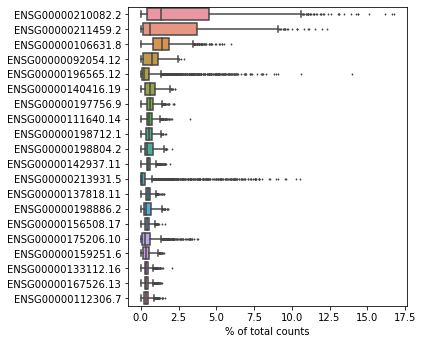

In [4]:
# genes with the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(adata, n_top=20, )

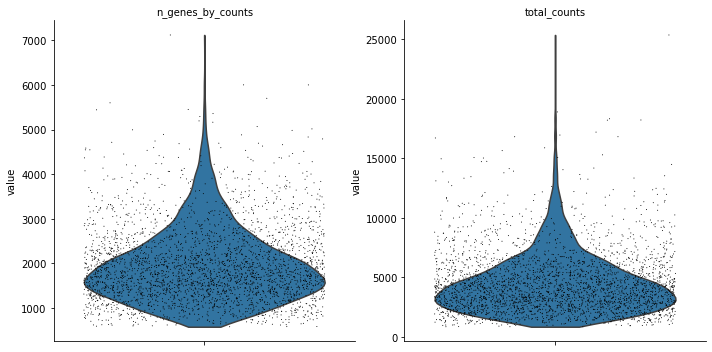

In [5]:
# compute metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


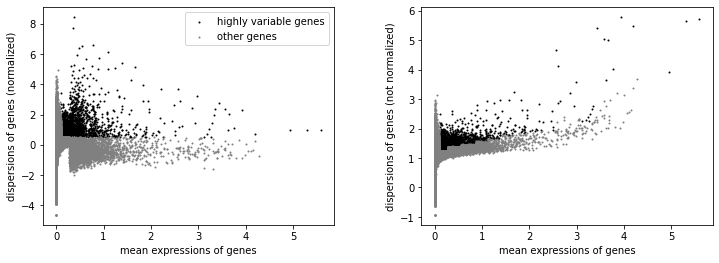

In [6]:
# total-count normalize 
sc.pp.normalize_total(adata, target_sum=1e4)
# logarithmize
sc.pp.log1p(adata)
# identify highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.1, max_mean=10, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


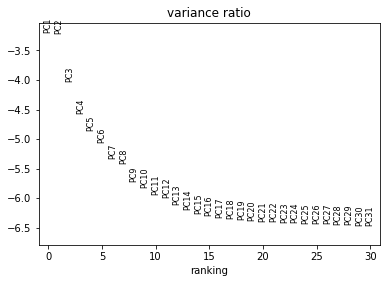

In [7]:
adata.raw = adata
# filtering
adata = adata[:, adata.var.highly_variable]
#sc.pp.regress_out(adata, ['total_counts']  # regress out effects
#sc.pp.scale(adata, max_value=10)  # scale to unit variance

# pca
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


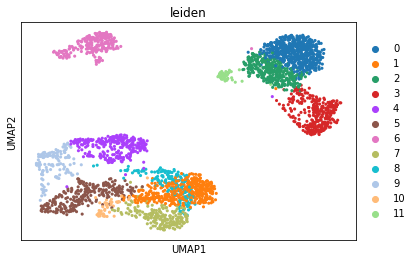

In [8]:
# neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.leiden(adata)
# embedding using UMAP
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)
sc.tl.umap(adata, init_pos='paga')
# cluster
sc.pl.umap(adata, color=['leiden'])

ranking genes
    finished (0:00:36)


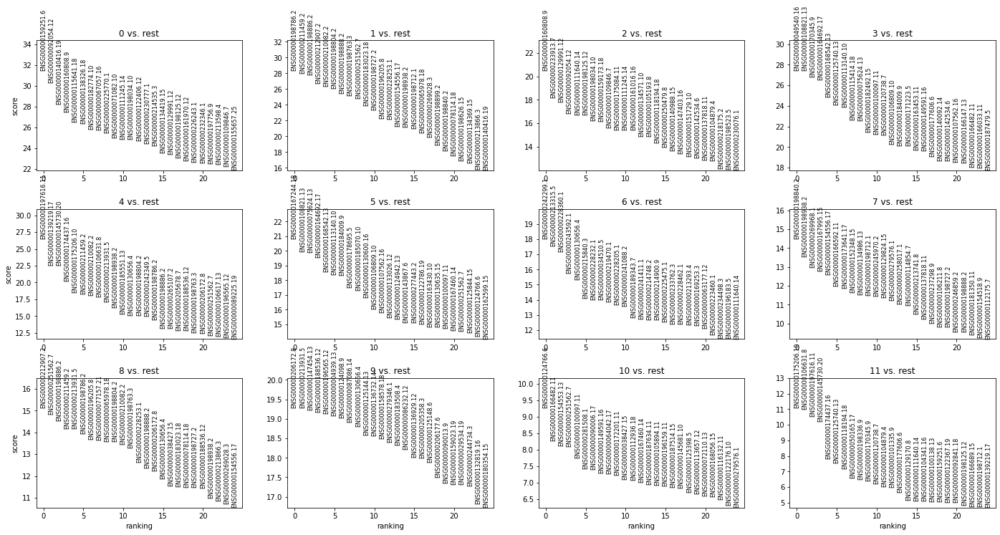

querying 1-100...done.
Finished.
                  _id     _score symbol      ensemblgene
query                                                   
ENSG00000159251    70  24.788485  ACTC1  ENSG00000159251
ENSG00000092054  4625  25.330097   MYH7  ENSG00000092054
ENSG00000140416  7168  24.393335   TPM1  ENSG00000140416
ENSG00000160808  4634  24.788490   MYL3  ENSG00000160808
ENSG00000115641  2274  24.798660   FHL2  ENSG00000115641
querying 1-100...done.
Finished.
1 input query terms found no hit:
	['ENSG00000279576']
Pass "returnall=True" to return complete lists of duplicate or missing query terms.
                             _id     _score   symbol notfound      ensemblgene
query                                                                         
ENSG00000198786             4540  24.788485      ND5      NaN  ENSG00000198786
ENSG00000211459  ENSG00000211459  26.152370  MT-RNR1      NaN  ENSG00000211459
ENSG00000198886             4538  24.788485      ND4      NaN  ENSG00000198886
E

In [9]:
sc.settings.verbosity = 2  # reduce the verbosity
# find marker genes
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
# write results
results_file = "/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/rank_results.h5ad"
adata.write(results_file)
# get top 100 ranked genes per cluster
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(100)

# convert gene names
def fix(name):
    return name.split(".")[0]
fixed_markers = top_markers.apply(np.vectorize(fix))

for column in fixed_markers:
    out = mg.querymany(fixed_markers[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    print(out.head(5))
    fixed_markers[column+"_symbol"] = out["symbol"].values
    
# output
fixed_markers.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/markers.csv")

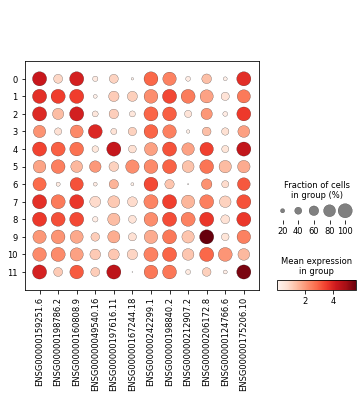

In [10]:
# visualize gene markers
marker_genes = top_markers.iloc[0].tolist()

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(100)

sc.pl.dotplot(adata, marker_genes, groupby='leiden')

In [11]:
# add x and y coordinates
metadata = pd.read_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/meta_data.tsv", 
                       sep="\t")
#print(metadata)
#adata.obs["new_x"] = metadata["new_x"]
#adata.obs["new_y"] = metadata["new_y"]
adata.obsm["spatial_coord"] = metadata.loc[:, ["new_x", "new_y"]]
print(adata.obsm["spatial_coord"])

         new_x  new_y
1x17x20  16.92  19.99
1x17x21  17.06  20.95
1x17x22  17.02  22.02
1x18x18  17.99  18.00
1x18x19  17.95  18.99
...        ...    ...
19x9x11   8.92  11.08
19x9x12   8.98  12.01
19x9x13   8.88  13.01
19x9x8    8.95   8.02
19x9x9    8.93   9.04

[3111 rows x 2 columns]


In [12]:
# split according to time points
pcw4 = adata[:"4x18x16", :]
print(pcw4.obs_names)
pcw6 = adata["5x10x21":"13x29x13", :]
print(pcw6.obs_names)
pcw9 = adata["14x11x10":, :]
print(pcw9.obs_names)

Index(['1x17x20', '1x17x21', '1x17x22', '1x18x18', '1x18x19', '1x18x20',
       '1x18x21', '1x18x22', '1x18x23', '1x19x17',
       ...
       '4x17x13', '4x17x14', '4x17x15', '4x17x16', '4x17x17', '4x17x8',
       '4x17x9', '4x18x13', '4x18x15', '4x18x16'],
      dtype='object', length=238)
Index(['5x10x21', '5x11x18', '5x11x19', '5x11x20', '5x11x21', '5x11x22',
       '5x11x23', '5x11x24', '5x12x17', '5x12x18',
       ...
       '13x26x16', '13x26x7', '13x26x8', '13x26x9', '13x27x14', '13x27x15',
       '13x27x7', '13x27x9', '13x28x12', '13x29x13'],
      dtype='object', length=1515)
Index(['14x11x10', '14x11x11', '14x11x7', '14x11x8', '14x11x9', '14x12x10',
       '14x12x11', '14x12x12', '14x12x13', '14x12x5',
       ...
       '19x23x17', '19x23x18', '19x8x11', '19x8x12', '19x9x10', '19x9x11',
       '19x9x12', '19x9x13', '19x9x8', '19x9x9'],
      dtype='object', length=1358)


In [13]:
"""
# compute knn graph for every time point 
coord_pcw4 = pcw4.obsm["spatial_coord"].to_numpy()
coord_pcw6 = pcw6.obsm["spatial_coord"].to_numpy()
coord_pcw9 = pcw9.obsm["spatial_coord"].to_numpy()

from sklearn.neighbors import kneighbors_graph
k = 5
A4 = kneighbors_graph(coord_pcw4, k, mode='distance', include_self=True).toarray()
A6 = kneighbors_graph(coord_pcw6, k, mode='distance', include_self=True).toarray()
A9 = kneighbors_graph(coord_pcw9, k, mode='distance', include_self=True).toarray()

pcw4.obsp["knn_distance"] = A4
pcw6.obsp["knn_distance"] = A6
pcw9.obsp["knn_distance"] = A9


B4 = kneighbors_graph(coord_pcw4, k, mode='connectivity', include_self=True).toarray()
B6 = kneighbors_graph(coord_pcw6, k, mode='connectivity', include_self=True).toarray()
B9 = kneighbors_graph(coord_pcw9, k, mode='connectivity', include_self=True).toarray()

pcw4.obsp["knn_connectivity"] = B4
pcw6.obsp["knn_connectivity"] = B6
pcw9.obsp["knn_connectivity"] = B9

#print(pcw4.obsp["knn_connectivity"])

import networkx as nx
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,15)

"""
# sus knn graphs
#plt.figure(1)
#G4 = nx.from_numpy_matrix(pcw4.obsp["knn_distance"])
#nx.draw(G4, node_size=5)

#plt.figure(2)
#G6 = nx.from_numpy_matrix(pcw6.obsp["knn_distance"])
#nx.draw(G6, node_size=5)

#plt.figure(3)
#G9 = nx.from_numpy_matrix(pcw9.obsp["knn_distance"])
#nx.draw(G9, node_size=5)
"""

# knn graph with placed nodes
# PCW 4
plt.figure(4)
xy = pcw4.obsm["spatial_coord"].to_numpy()
graph4 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph4.add_node(node)
    
# add edges to graph        
#graph4.add_edges_from(B4)
adj_matrix = pcw4.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph4.add_edge(u,v)
nx.draw(graph4, [(x,y) for x,y in xy], node_size=10)

# PCW 6
plt.figure(5)
xy = pcw6.obsm["spatial_coord"].to_numpy()
graph6 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph6.add_node(node)
    
# add edges to graph        
adj_matrix = pcw6.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph6.add_edge(u,v)
    
nx.draw(graph6, [(x,y) for x,y in xy], node_size=10)

# PCW 9
plt.figure(6)
xy = pcw9.obsm["spatial_coord"].to_numpy()
graph9 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph9.add_node(node)
    
# add edges to graph        
adj_matrix = pcw9.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph9.add_edge(u,v)
    
nx.draw(graph9, [(x,y) for x,y in xy], node_size=10)
plt.show()
"""

'\n\n# knn graph with placed nodes\n# PCW 4\nplt.figure(4)\nxy = pcw4.obsm["spatial_coord"].to_numpy()\ngraph4 = nx.Graph()\n# add nodes to graph\nfor node in range(len(xy)):\n    graph4.add_node(node)\n    \n# add edges to graph        \n#graph4.add_edges_from(B4)\nadj_matrix = pcw4.obsp["knn_connectivity"]\nfor u in range(len(xy)):\n    for v in range(len(adj_matrix[u])):\n        if adj_matrix[u][v] == 1:\n            graph4.add_edge(u,v)\nnx.draw(graph4, [(x,y) for x,y in xy], node_size=10)\n\n# PCW 6\nplt.figure(5)\nxy = pcw6.obsm["spatial_coord"].to_numpy()\ngraph6 = nx.Graph()\n# add nodes to graph\nfor node in range(len(xy)):\n    graph6.add_node(node)\n    \n# add edges to graph        \nadj_matrix = pcw6.obsp["knn_connectivity"]\nfor u in range(len(xy)):\n    for v in range(len(adj_matrix[u])):\n        if adj_matrix[u][v] == 1:\n            graph6.add_edge(u,v)\n    \nnx.draw(graph6, [(x,y) for x,y in xy], node_size=10)\n\n# PCW 9\nplt.figure(6)\nxy = pcw9.obsm["spatial_coor

In [14]:
"""
### PROBLEM: knn chooses many a bunch of points together ###
from math import sqrt
def mydist(x, y):
    r = 0.5
    d = sqrt(sum((x - y)**2))
    if d>r:
        return d
    else:
        return float('inf')

# compute knn graph for every time point 
coord_pcw4 = pcw4.obsm["spatial_coord"].to_numpy()
coord_pcw6 = pcw6.obsm["spatial_coord"].to_numpy()
coord_pcw9 = pcw9.obsm["spatial_coord"].to_numpy()

from sklearn.neighbors import kneighbors_graph
k = 5
A4 = kneighbors_graph(coord_pcw4, k, mode='distance', metric='pyfunc', include_self=True, metric_params={'func':mydist}).toarray()
A6 = kneighbors_graph(coord_pcw6, k, mode='distance', metric='pyfunc', include_self=True, metric_params={'func':mydist}).toarray()
A9 = kneighbors_graph(coord_pcw9, k, mode='distance', metric='pyfunc', include_self=True, metric_params={'func':mydist}).toarray()

pcw4.obsp["knn_distance"] = A4
pcw6.obsp["knn_distance"] = A6
pcw9.obsp["knn_distance"] = A9

B4 = kneighbors_graph(coord_pcw4, k, mode='connectivity', metric='pyfunc', include_self=True, metric_params={'func':mydist}).toarray()
B6 = kneighbors_graph(coord_pcw6, k, mode='connectivity', metric='pyfunc', include_self=True, metric_params={'func':mydist}).toarray()
B9 = kneighbors_graph(coord_pcw9, k, mode='connectivity', metric='pyfunc', include_self=True, metric_params={'func':mydist}).toarray()

pcw4.obsp["knn_connectivity"] = B4
pcw6.obsp["knn_connectivity"] = B6
pcw9.obsp["knn_connectivity"] = B9

import networkx as nx
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,15)


# knn graph with placed nodes
# PCW 4
plt.figure(4)
xy = pcw4.obsm["spatial_coord"].to_numpy()
graph4 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph4.add_node(node)
    
# add edges to graph        
#graph4.add_edges_from(B4)
adj_matrix = pcw4.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph4.add_edge(u,v)
nx.draw(graph4, [(x,y) for x,y in xy], node_size=10)

# PCW 6
plt.figure(5)
xy = pcw6.obsm["spatial_coord"].to_numpy()
graph6 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph6.add_node(node)
    
# add edges to graph        
adj_matrix = pcw6.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph6.add_edge(u,v)
    
nx.draw(graph6, [(x,y) for x,y in xy], node_size=10)

# PCW 9
plt.figure(6)
xy = pcw9.obsm["spatial_coord"].to_numpy()
graph9 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph9.add_node(node)
    
# add edges to graph        
adj_matrix = pcw9.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph9.add_edge(u,v)
    
nx.draw(graph9, [(x,y) for x,y in xy], node_size=10)
plt.show()
"""

'\n### PROBLEM: knn chooses many a bunch of points together ###\nfrom math import sqrt\ndef mydist(x, y):\n    r = 0.5\n    d = sqrt(sum((x - y)**2))\n    if d>r:\n        return d\n    else:\n        return float(\'inf\')\n\n# compute knn graph for every time point \ncoord_pcw4 = pcw4.obsm["spatial_coord"].to_numpy()\ncoord_pcw6 = pcw6.obsm["spatial_coord"].to_numpy()\ncoord_pcw9 = pcw9.obsm["spatial_coord"].to_numpy()\n\nfrom sklearn.neighbors import kneighbors_graph\nk = 5\nA4 = kneighbors_graph(coord_pcw4, k, mode=\'distance\', metric=\'pyfunc\', include_self=True, metric_params={\'func\':mydist}).toarray()\nA6 = kneighbors_graph(coord_pcw6, k, mode=\'distance\', metric=\'pyfunc\', include_self=True, metric_params={\'func\':mydist}).toarray()\nA9 = kneighbors_graph(coord_pcw9, k, mode=\'distance\', metric=\'pyfunc\', include_self=True, metric_params={\'func\':mydist}).toarray()\n\npcw4.obsp["knn_distance"] = A4\npcw6.obsp["knn_distance"] = A6\npcw9.obsp["knn_distance"] = A9\n\nB4 =

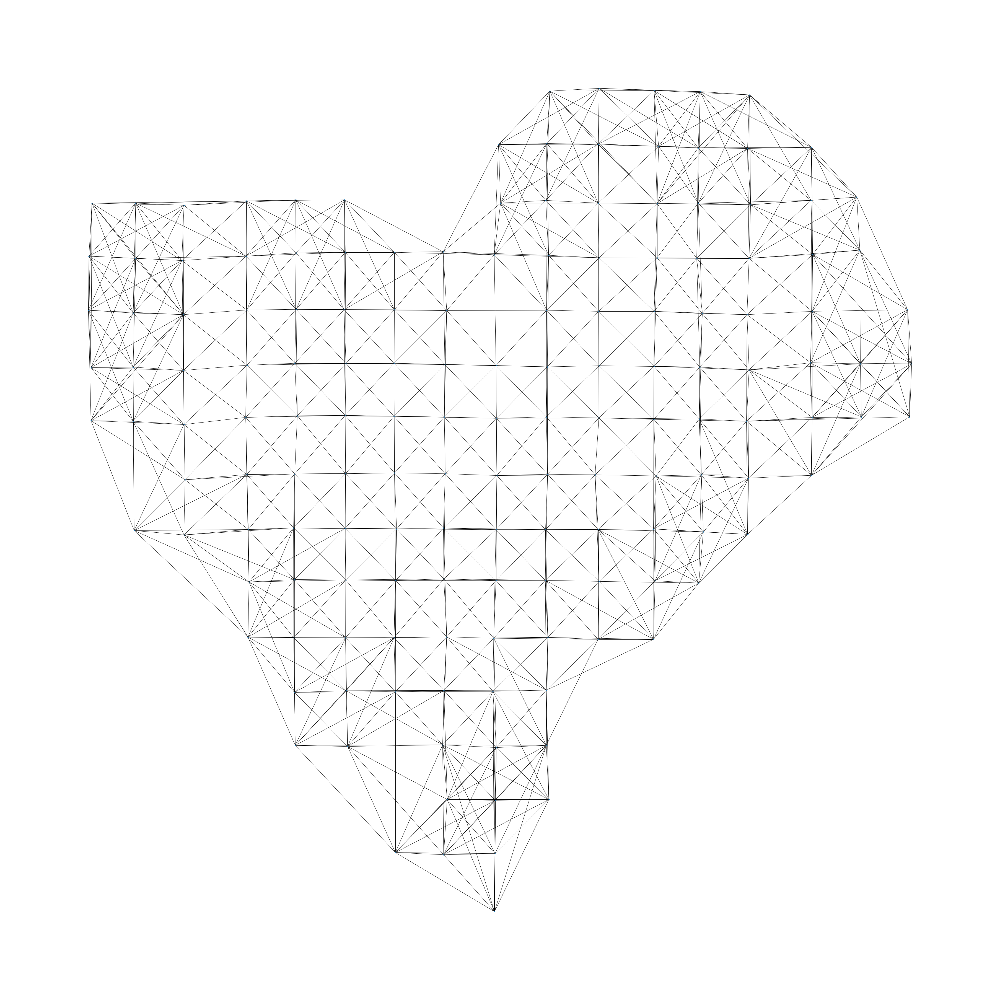

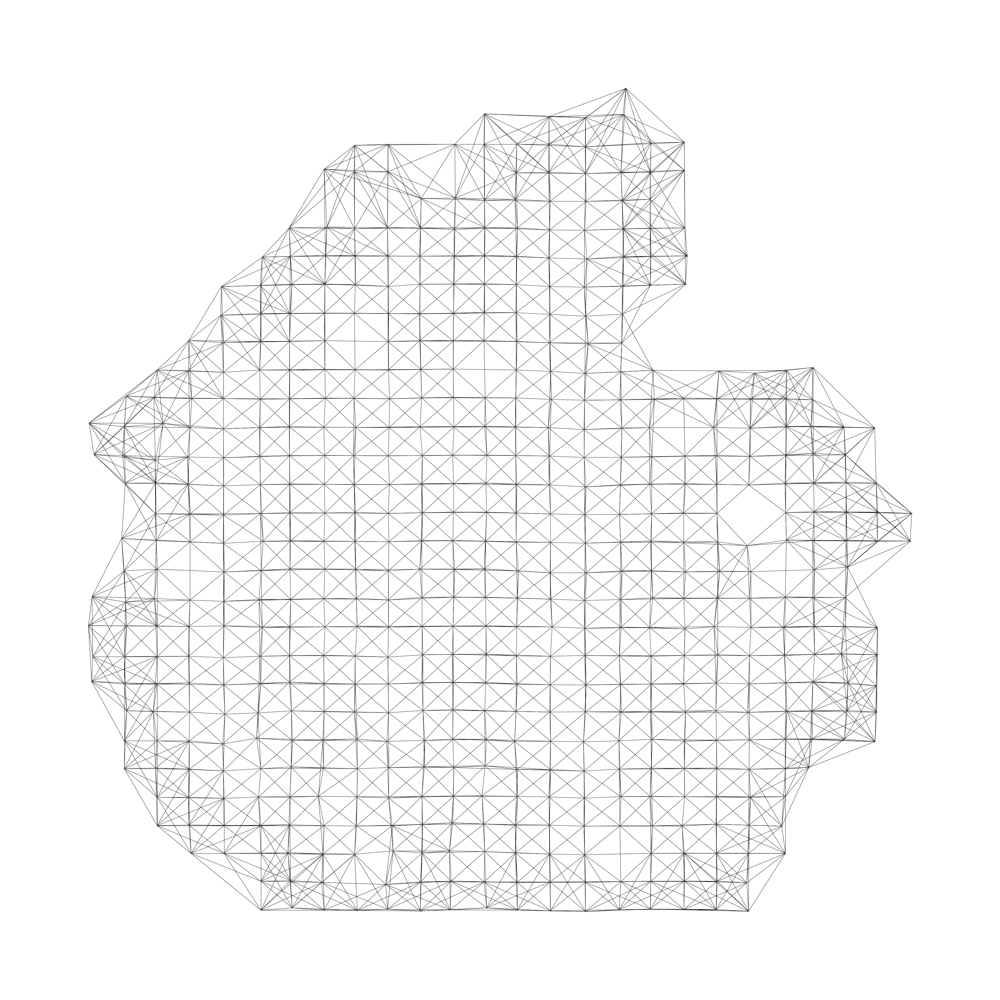

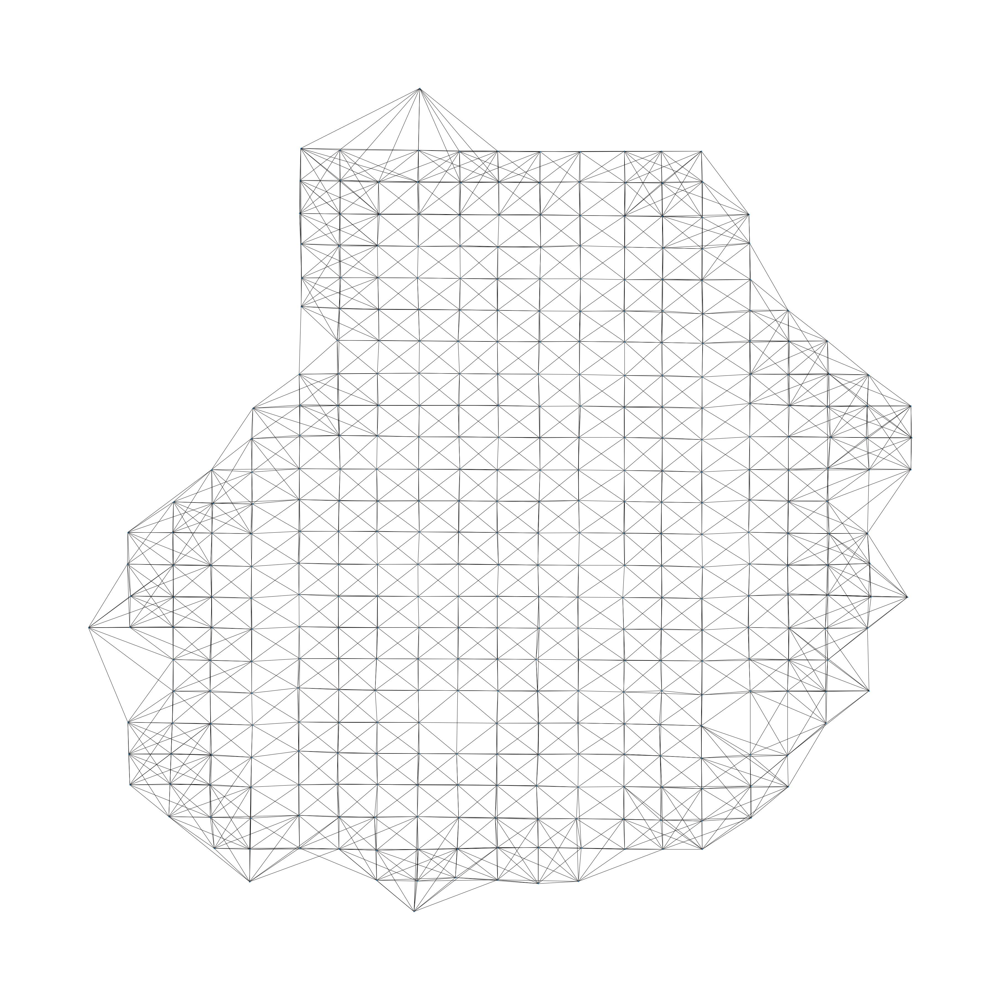

In [15]:
from sklearn.neighbors import kneighbors_graph

# merge replicate spots
pcw4 = adata[:"4x18x16", :]
pcw6 = adata["5x10x21":"13x29x13", :]
pcw9 = adata["14x11x10":, :]

coord_pcw4 = pcw4.obsm["spatial_coord"].to_numpy()
coord_pcw6 = pcw6.obsm["spatial_coord"].to_numpy()
coord_pcw9 = pcw9.obsm["spatial_coord"].to_numpy()

from sklearn.neighbors import radius_neighbors_graph
r = 0.5
R4 = radius_neighbors_graph(coord_pcw4, r, mode='connectivity', include_self=False).toarray()
R6 = radius_neighbors_graph(coord_pcw6, r, mode='connectivity', include_self=False).toarray()
R9 = radius_neighbors_graph(coord_pcw9, r, mode='connectivity', include_self=False).toarray()

pcw4.obsp["rnn_connectivity"] = R4
pcw6.obsp["rnn_connectivity"] = R6
pcw9.obsp["rnn_connectivity"] = R9

# group duplicate spots together
group = 1
pcw4.obs["spot_group"] = ["0"]*(pcw4.n_obs)
for gene_ind in range(len(R4)):
    if pcw4.obs["spot_group"][gene_ind] == "0":
        pcw4.obs["spot_group"].iat[gene_ind] = str(group)
        for connected_ind in range(len(R4[gene_ind])):
            if R4[gene_ind][connected_ind] == 1:
                pcw4.obs["spot_group"].iat[connected_ind] = str(group)
        group += 1
        
group = 1
pcw6.obs["spot_group"] = ["0"]*(pcw6.n_obs)
for gene_ind in range(len(R6)):
    if pcw6.obs["spot_group"][gene_ind] == "0":
        pcw6.obs["spot_group"].iat[gene_ind] = str(group)
        for connected_ind in range(len(R6[gene_ind])):
            if R6[gene_ind][connected_ind] == 1:
                pcw6.obs["spot_group"].iat[connected_ind] = str(group)
        group += 1
        
group = 1
pcw9.obs["spot_group"] = ["0"]*(pcw9.n_obs)
for gene_ind in range(len(R9)):
    if pcw9.obs["spot_group"][gene_ind] == "0":
        pcw9.obs["spot_group"].iat[gene_ind] = str(group)
        for connected_ind in range(len(R9[gene_ind])):
            if R9[gene_ind][connected_ind] == 1:
                pcw9.obs["spot_group"].iat[connected_ind] = str(group)
        group += 1        

# merge 
import anndata
import networkx as nx
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (50,50)

# knn graphs
k = 10

# PCW 4
df4 = sc.get.obs_df(pcw4, keys=["spot_group", *pcw4.var_names], obsm_keys=[("spatial_coord", "new_x"), ("spatial_coord", "new_y")])
group_df4 = df4.groupby("spot_group").mean()
grouped_pcw4 = anndata.AnnData(X=group_df4.iloc[:, :-2], obsm=group_df4.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]])
grouped_pcw4.obsm["spatial_coord"] = group_df4.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]]

coord_pcw4 = grouped_pcw4.obsm["spatial_coord"].to_numpy()
B4 = kneighbors_graph(coord_pcw4, k, mode='connectivity', include_self=False).toarray()
grouped_pcw4.obsp["knn_connectivity"] = B4

# PCW 6
df6 = sc.get.obs_df(pcw6, keys=["spot_group", *pcw6.var_names], obsm_keys=[("spatial_coord", "new_x"), ("spatial_coord", "new_y")])
group_df6 = df6.groupby("spot_group").mean()
grouped_pcw6 = anndata.AnnData(X=group_df6.iloc[:, :-2], obsm=group_df6.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]])
grouped_pcw6.obsm["spatial_coord"] = group_df6.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]]

coord_pcw6 = grouped_pcw6.obsm["spatial_coord"].to_numpy()
B6 = kneighbors_graph(coord_pcw6, k, mode='connectivity', include_self=False).toarray()
grouped_pcw6.obsp["knn_connectivity"] = B6

# PCW 9
df9 = sc.get.obs_df(pcw9, keys=["spot_group", *pcw9.var_names], obsm_keys=[("spatial_coord", "new_x"), ("spatial_coord", "new_y")])
group_df9 = df9.groupby("spot_group").mean()
grouped_pcw9 = anndata.AnnData(X=group_df9.iloc[:, :-2], obsm=group_df9.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]])
grouped_pcw9.obsm["spatial_coord"] = group_df9.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]]

coord_pcw9 = grouped_pcw9.obsm["spatial_coord"].to_numpy()
B9 = kneighbors_graph(coord_pcw9, k, mode='connectivity', include_self=False).toarray()
grouped_pcw9.obsp["knn_connectivity"] = B9

del grouped_pcw4.obsm['spatial_coord-new_x']
del grouped_pcw4.obsm['spatial_coord-new_y']

# plot graphs
# PCW 4
plt.figure(1)
xy = grouped_pcw4.obsm["spatial_coord"].to_numpy()
graph4 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph4.add_node(node)
    
# add edges to graph        
#graph4.add_edges_from(B4)
adj_matrix = grouped_pcw4.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph4.add_edge(u,v)
nx.draw(graph4, [(x,y) for x,y in xy], node_size=10)

# PCW 6
plt.figure(2)
xy = grouped_pcw6.obsm["spatial_coord"].to_numpy()
graph6 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph6.add_node(node)
    
# add edges to graph        
adj_matrix = grouped_pcw6.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph6.add_edge(u,v)
nx.draw(graph6, [(x,y) for x,y in xy], node_size=10)

# PCW 9
plt.figure(3)
xy = grouped_pcw9.obsm["spatial_coord"].to_numpy()
graph9 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph9.add_node(node)
    
# add edges to graph        
adj_matrix = grouped_pcw9.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph9.add_edge(u,v)
nx.draw(graph9, [(x,y) for x,y in xy], node_size=10)


In [16]:
# add gene expression
from scipy.spatial import distance_matrix
from sklearn.neighbors import NearestNeighbors

def PCA(adata):
    sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
    # total-count normalize 
    sc.pp.normalize_total(adata, target_sum=1e4)
    # logarithmize
    sc.pp.log1p(adata)
    # identify highly variable genes
    #sc.pp.highly_variable_genes(adata, min_mean=0.1, max_mean=10, min_disp=0.5)
    #adata.raw = adata
    # filtering
    #adata = adata[:, adata.var.highly_variable]
    # pca
    #print(adata)
    sc.tl.pca(adata, n_comps=50, svd_solver='arpack')
    return adata


def weighted_distance_matrix(adata, k):  # computes the spatial distance matrix
    # euclidian distance matrix
    adata.obsp["spa_distances"] = distance_matrix(adata.obsm['spatial_coord'].to_numpy(), adata.obsm['spatial_coord'].to_numpy())
    #print(adata.obsp["spa_distances"])
    # find kth nearest neighbour
    nbrs = NearestNeighbors(n_neighbors=k).fit(adata.obsm['spatial_coord'].to_numpy())
    distances, indices = nbrs.kneighbors(adata.obsm['spatial_coord'].to_numpy())
    #print(distances[0])
    #print(indices[0])
    # compute affinity matrix
    aff = np.zeros((adata.n_obs, adata.n_obs))
    for i in range(len(aff)):
        #mu = np.mean(distances[i])
        for j in range(len(aff[i])):
            # find distance of kth nearest neighbour
            sigma = distances[i][k-1]
            # compute affinity with gaussian kernel
            kernel = np.exp(-(adata.obsp["spa_distances"][i][j]) ** 2 / (sigma ** 2))
            # sigma = ??
            #kernel = np.exp(-(adata_pca.obsp["gene_distances"][i][j]-mu) ** 2 / (sigma ** 2))
            #print(kernel)
            aff[i][j] = kernel
    #print(aff)
    # symmetrize
    aff = (aff + np.transpose(aff))/2
    #print(aff)
    
    return aff


def affinity_matrix(adata, k):  # computes the gene distance matrix
    # PCA
    #adata_pca = PCA(adata)
    # euclidian distance matrix
    adata.obsp["gene_distances"] = distance_matrix(adata.obsm['X_pca'], adata.obsm['X_pca'])  #len(adata)xlen(adata)
    #print(adata_pca.obsp["gene_distances"])
    # find kth nearest neighbour
    nbrs = NearestNeighbors(n_neighbors=k).fit(adata.obsm["X_pca"])
    distances, indices = nbrs.kneighbors(adata.obsm["X_pca"])
    #print(distances)
    #print(indices)
    # compute affinity matrix
    aff = np.zeros((adata.n_obs, adata.n_obs))
    for i in range(len(aff)):
        #mu = np.mean(distances[i])
        for j in range(len(aff[i])):
            # find distance of kth nearest neighbour
            sigma = distances[i][k-1]
            # compute affinity with gaussian kernel
            kernel = np.exp(-(adata.obsp["gene_distances"][i][j]) ** 2 / (sigma ** 2))
            # sigma = ??
            #kernel = np.exp(-(adata_pca.obsp["gene_distances"][i][j]-mu) ** 2 / (sigma ** 2))
            #print(kernel)
            aff[i][j] = kernel
    #print(aff)
    # symmetrize
    aff = (aff + np.transpose(aff))/2
    #print(aff)
    
    return aff
            

alpha = 0.5
grouped_pcw4 = PCA(grouped_pcw4)
# compute distance matrix
#grouped_pcw4.obsp["spa_distances"] = distance_matrix(grouped_pcw4.obsm['spatial_coord'].to_numpy(), grouped_pcw4.obsm['spatial_coord'].to_numpy())
# compute distance matrix w/ gaussian kernel
grouped_pcw4.obsp["gau_spa_distances"] = weighted_distance_matrix(grouped_pcw4, k=10)
# compute affinity matrix of gene expression
grouped_pcw4.obsp["aff_matrix"] = affinity_matrix(grouped_pcw4, k=10)
# aggregate using element-wise multiplication
#grouped_pcw4.obsp["agg_matrix"] = np.multiply(grouped_pcw4.obsp["gau_spa_distances"], grouped_pcw4.obsp["aff_matrix"])
grouped_pcw4.obsp["agg_matrix"] = np.add(alpha/2*grouped_pcw4.obsp["gau_spa_distances"], (1-alpha)/2*grouped_pcw4.obsp["aff_matrix"])
#print(grouped_pcw4.obsp["agg_matrix"])

grouped_pcw6 = PCA(grouped_pcw6)
# compute distance matrix
#grouped_pcw6.obsp["spa_distances"] = distance_matrix(grouped_pcw6.obsm['spatial_coord'].to_numpy(), grouped_pcw6.obsm['spatial_coord'].to_numpy())
# compute distance matrix w/ gaussian kernel
grouped_pcw6.obsp["gau_spa_distances"] = weighted_distance_matrix(grouped_pcw6, k=10)
# compute affinity matrix
grouped_pcw6.obsp["aff_matrix"] = affinity_matrix(grouped_pcw6, k=10)
# aggregate using element-wise multiplication
#grouped_pcw6.obsp["agg_matrix"] = np.multiply(grouped_pcw6.obsp["gau_spa_distances"], grouped_pcw6.obsp["aff_matrix"])
grouped_pcw6.obsp["agg_matrix"] = np.add(alpha/2*grouped_pcw6.obsp["gau_spa_distances"], (1-alpha)/2*grouped_pcw6.obsp["aff_matrix"])
#print(grouped_pcw6.obsp["agg_matrix"])

grouped_pcw9 = PCA(grouped_pcw9)
# compute distance matrix
#grouped_pcw9.obsp["spa_distances"] = distance_matrix(grouped_pcw9.obsm['spatial_coord'].to_numpy(), grouped_pcw9.obsm['spatial_coord'].to_numpy())
# compute distance matrix w/ gaussian kernel
grouped_pcw9.obsp["gau_spa_distances"] = weighted_distance_matrix(grouped_pcw9, k=10)
#print(grouped_pcw9.obsp["gau_spa_distances"])
#print("-----------")
# compute affinity matrix
grouped_pcw9.obsp["aff_matrix"] = affinity_matrix(grouped_pcw9, k=10)
#print(grouped_pcw9.obsp["aff_matrix"] )
# aggregate using element-wise multiplication
# affinity matrix on spatial distances
#grouped_pcw9.obsp["agg_matrix"] = np.multiply(grouped_pcw9.obsp["gau_spa_distances"], grouped_pcw9.obsp["aff_matrix"])
grouped_pcw9.obsp["agg_matrix"] = np.add(alpha/2*grouped_pcw9.obsp["gau_spa_distances"], (1-alpha)/2*grouped_pcw9.obsp["aff_matrix"])
#print("-----------")
#print(grouped_pcw9.obsp["agg_matrix"])

#w1^(a)*w2^(1-a)
# weighted average 


normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)


Affinity using Gaussian kernel according to paper
$$ A(i, j) = e^{-\frac{Dist(i,j)^2}{\sigma^2}} $$
Only based on gene expression\
Or should it be
$$ A(i, j) = e^{-\frac{(x-\mu)^2}{\sigma^2}} $$
what's $\sigma$ tho


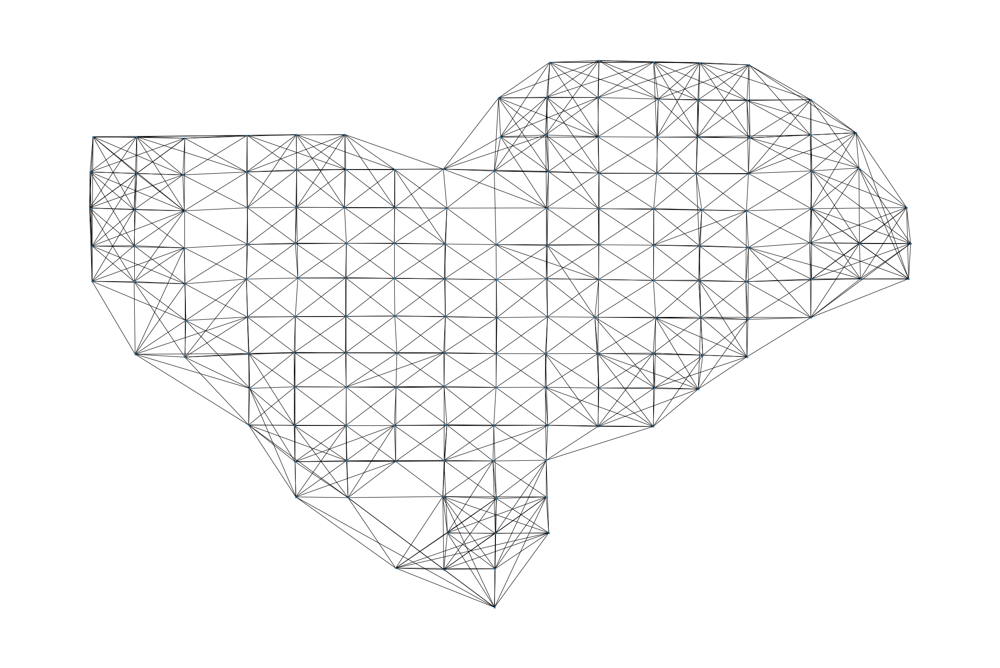

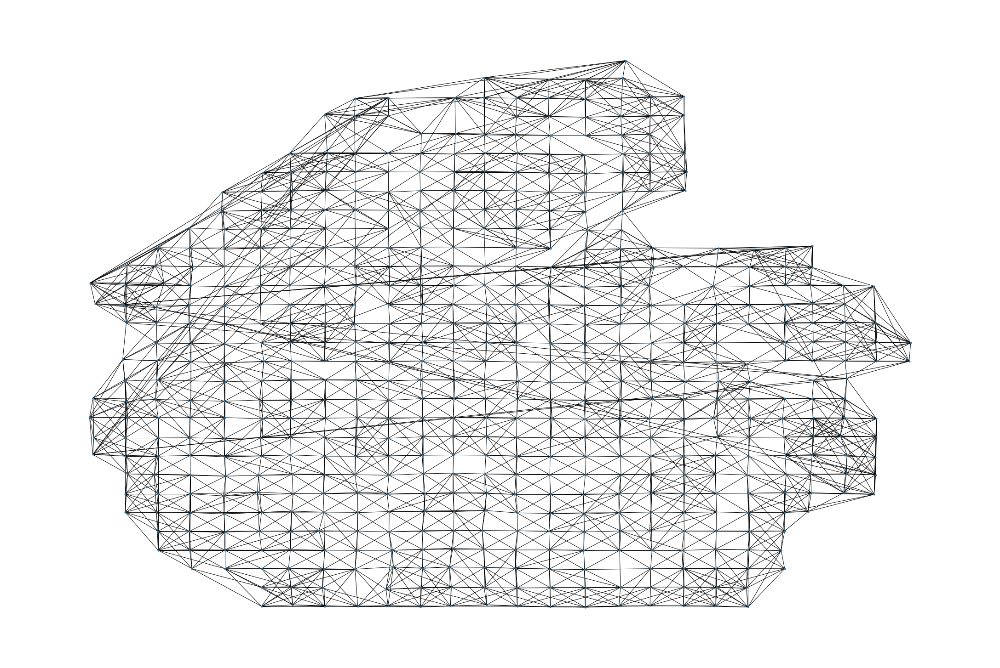

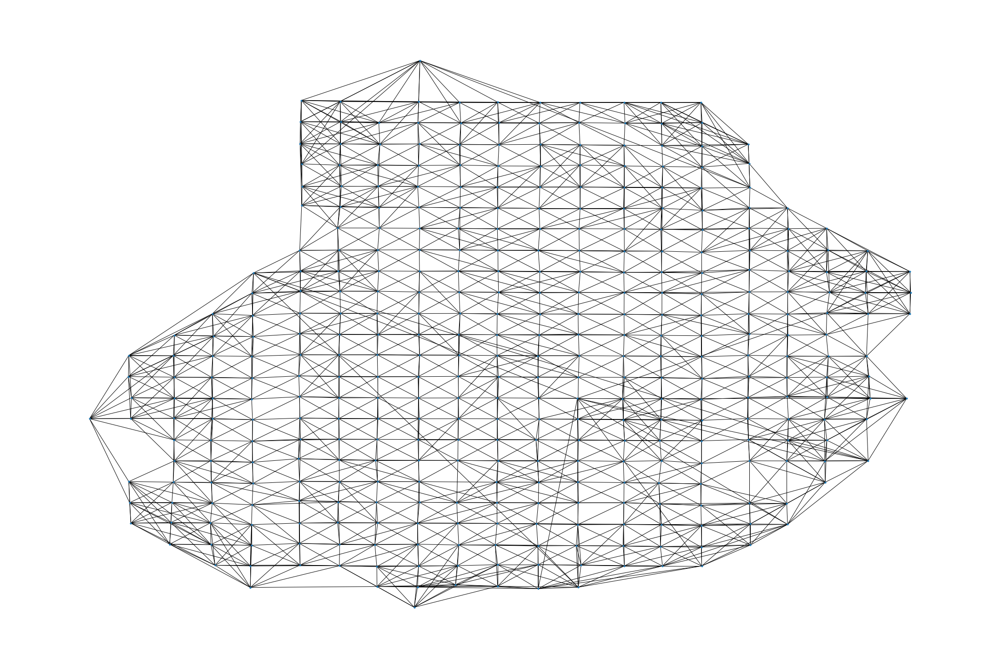

In [46]:
# knn on aggregated distance matrix
from sklearn.neighbors import NearestNeighbors
plt.rcParams["figure.figsize"] = (30,20)

def knn_graph(adata):
    neigh = NearestNeighbors(n_neighbors=10, metric="precomputed")
    neigh.fit(adata.obsp["agg_matrix"])
    C = kneighbors_graph(adata.obsp["agg_matrix"], k, mode='connectivity', include_self=False).toarray()
    plt.figure()
    xy = adata.obsm["spatial_coord"].to_numpy()
    graph = nx.Graph()
    # add nodes to graph
    for node in range(len(xy)):
        graph.add_node(node)

    # add edges to graph        
    #graph4.add_edges_from(B4)
    adj_matrix = C
    for u in range(len(xy)):
        for v in range(len(adj_matrix[u])):
            if adj_matrix[u][v] == 1:
                graph.add_edge(u,v)
    nx.draw(graph, [(x,y) for x,y in xy], node_size=10)
    
    return C
    
grouped_pcw4.obsp["agg_knn_connectivity"] = knn_graph(grouped_pcw4)
#print(grouped_pcw4.obsp["agg_knn_connectivity"])
grouped_pcw6.obsp["agg_knn_connectivity"] = knn_graph(grouped_pcw6)
grouped_pcw9.obsp["agg_knn_connectivity"] = knn_graph(grouped_pcw9)

In [47]:
"""
import math
import torch
from torch.nn.parameter import Parameter
from torch.nn.modules.module import Module

import torch.nn as nn
import torch.nn.functional as F
from sklearn.cluster import KMeans
import torch.optim as optim
from random import shuffle
import pandas as pd
import numpy as np
import scanpy as sc


class GraphConvolution(Module):
    #Simple GCN layer, similar to https://arxiv.org/abs/1609.02907

    def __init__(self, in_features, out_features, bias=True):
        super(GraphConvolution, self).__init__()
        self.in_features = in_features  # number of in_features??
        self.out_features = out_features
        self.weight = Parameter(torch.FloatTensor(in_features, out_features))  # random?
        if bias:
            self.bias = Parameter(torch.FloatTensor(out_features))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.weight.size(1))  # size of the first dimension?
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def forward(self, input, adj):
        support = torch.mm(input, self.weight)  # matrix multiplication
        output = torch.spmm(adj, support)
        if self.bias is not None:
            return output + self.bias
        else:
            return output

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ' -> ' \
               + str(self.out_features) + ')'

    
class GCN(nn.Module):
    def __init__(self, nfeat, nhid, nclass, dropout):
        super(GCN, self).__init__()

        self.gc1 = GraphConvolution(nfeat, nhid)
        self.gc2 = GraphConvolution(nhid, nclass)
        self.dropout = dropout

    def forward(self, x, adj):
        x = F.relu(self.gc1(x, adj))
        x = F.dropout(x, self.dropout, training=self.training)
        x = self.gc2(x, adj)
        return F.log_softmax(x, dim=1)


#gcn = GraphConvolution(grouped_pcw4.obsp["agg_matrix"])  # 50 pca features?
#x = torch.FloatTensor(grouped_pcw4.obsm["X_pca"].copy())
#adj = torch.FloatTensor(grouped_pcw4.obsp["agg_knn_connectivity"])
#gcn.forward(x, adj)  # adj supposed to be connectivities or distance?
"""

'\nimport math\nimport torch\nfrom torch.nn.parameter import Parameter\nfrom torch.nn.modules.module import Module\n\nimport torch.nn as nn\nimport torch.nn.functional as F\nfrom sklearn.cluster import KMeans\nimport torch.optim as optim\nfrom random import shuffle\nimport pandas as pd\nimport numpy as np\nimport scanpy as sc\n\n\nclass GraphConvolution(Module):\n    #Simple GCN layer, similar to https://arxiv.org/abs/1609.02907\n\n    def __init__(self, in_features, out_features, bias=True):\n        super(GraphConvolution, self).__init__()\n        self.in_features = in_features  # number of in_features??\n        self.out_features = out_features\n        self.weight = Parameter(torch.FloatTensor(in_features, out_features))  # random?\n        if bias:\n            self.bias = Parameter(torch.FloatTensor(out_features))\n        else:\n            self.register_parameter(\'bias\', None)\n        self.reset_parameters()\n\n    def reset_parameters(self):\n        stdv = 1. / math.sqrt(

In [19]:
#print(grouped_pcw4.n_obs, grouped_pcw4.n_vars)
#print(grouped_pcw4.obsp)
#gcn = GraphConvolution(50,50)  # 50 pca features?
#x = torch.FloatTensor(grouped_pcw4.obsm["X_pca"].copy())
#adj = torch.FloatTensor(grouped_pcw4.obsp["agg_knn_connectivity"])
#gcn.forward(x, adj)  # adj supposed to be connectivities or distance?

Every neural network layer can then be written as a non-linear function
$$ H(l+1)=f(H(l),A) $$

$$ f(H^{(l)},A)=σ(D^{−1/2}(A+I) D^{−1/2}H^{(l)}W^{(l)}) $$

with adjacency matrix $A$ (or some function thereof) <br>
symmetric normalization $D^{−1/2}(A+I) D^{−1/2}$ <br>
$W(l)$ is a weight matrix for the l-th neural network layer <br>
$σ(⋅)$ is a non-linear activation function like the ReLU

In [20]:
'''
# build a VGAE with me whoooooooo
import os

import numpy as np
import torch
import torch.nn.functional as F
from pyro.contrib.examples.util import MNIST
import torch.nn as nn
import torchvision.transforms as transforms

import pyro
import pyro.distributions as dist
import pyro.contrib.examples.util  # patches torchvision
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import Adam


# GCN layer
# bias??
class GraphConvolution(nn.Module):
    def __init__(self, input_dim, output_dim, activation = F.relu, **kwargs):
        super(GraphConvolution, self).__init__(**kwargs)
        self.weight = glorot_init(input_dim, output_dim)  # Glorot weight initialization
        self.activation = activation

    def forward(self, inputs, adj):
        x = inputs
        x = torch.mm(x, self.weight)
        x = torch.mm(adj, x)
        outputs = x
        #print(outputs)
        #outputs = self.activation(x)  # ReLU(AXW)
        return outputs

def glorot_init(input_dim, output_dim):  # Glorot weight initialization
    init_range = np.sqrt(6.0/(input_dim + output_dim))
    initial = torch.rand(input_dim, output_dim)*2*init_range - init_range
    return nn.Parameter(initial)


# encoder
class Encoder(nn.Module):
    def __init__(self, in_dim, z_dim, nhid, hidden_dim, dropout):  # dropout is probability p?
        super().__init__()
        # number of gcn layers?
        self.gc1 = GraphConvolution(in_dim, nhid)
        # Compute Graph Convolutional Layers for the mean parameter
        #self.gcn_mean = GraphConvolution(hidden_dim, z_dim, activation=lambda x:x)  
        # Compute Graph Convolutional Layers for the variance  parameter
        #self.gcn_logstddev = GraphConvolution(hidden_dim, z_dim, activation=lambda x:x)
        self.dropout = dropout
        # setup the three linear transformations used
        self.fc1 = nn.Linear(nhid, hidden_dim)
        self.fc21 = nn.Linear(hidden_dim, z_dim)
        self.fc22 = nn.Linear(hidden_dim, z_dim)
        # setup the non-linearities
        self.softplus = nn.Softplus()  # smooth approximation to reLU
        
    def forward(self, x, adj):
        # define the forward computation on the input X
        # then compute the hidden units
        #x = self.gc1(x, adj)  # ReLU(AXW)
        _ = self.gc1(x, adj)
        print(_)
        x = F.relu(_)
        #x = F.relu(self.gc1(x, adj))
        print(x)
        x = F.dropout(x, self.dropout, training=self.training)  # if self.training = true
        hidden = self.softplus(self.fc1(x))
        # then return a mean vector and a (positive) square root covariance
        z_loc = self.softplus(self.fc21(hidden))
        z_scale = torch.exp(self.softplus(self.fc22(hidden)))  # e^()
        return z_loc, z_scale
    
    
class Decoder(nn.Module):
    def __init__(self, in_dim, z_dim, hidden_dim):
        super().__init__()
        # setup the two linear transformations used
        self.fc1 = nn.Linear(z_dim, hidden_dim)
        self.fc21 = nn.Linear(hidden_dim, in_dim)
        self.fc22 = nn.Linear(hidden_dim, in_dim)
        # setup the non-linearities
        self.softplus = nn.Softplus()

    def forward(self, z):
        # define the forward computation on the latent z
        # first compute the hidden units
        hidden = self.softplus(self.fc1(z))
        
        # total count is number of negative Bernoulli trials
        # probs is event probabilities of success
        count = self.softplus(self.fc21(hidden))
        prob = self.softplus(self.fc22(hidden))
        # return ?? dist params
        return count, prob
    

#VAE
import pyro
import pyro.distributions as dist

#from scvi import _CONSTANTS
from scvi.module.base import PyroBaseModuleClass

class VAE(PyroBaseModuleClass):
    def __init__(self, n_input, n_latent, nhid, n_hidden, n_clusters, dropout):
        super().__init__()
        self.n_latent = n_latent
        self.n_input = n_input
        self.n_clusters = n_clusters
       # in the init, we create the parameters of our elementary stochastic computation unit.

        # First, we setup the parameters of the generative model
        self.decoder = Decoder(n_input, n_latent, n_hidden)
        self.log_theta = torch.nn.Parameter(torch.randn(n_input))
        self.gate_logits = torch.nn.Parameter(torch.randn(n_input))
        # what is this
        self.embeddings = nn.Parameter(torch.randn(self.n_clusters, n_latent) * 0.05, requires_grad=True)
        # Second, we setup the parameters of the variational distribution
        self.encoder = Encoder(n_input, n_latent, nhid, n_hidden, dropout) 
        

    # define the model p(x|z)p(z)
    def model(self, x):
        # register PyTorch module `decoder` with Pyro p(z) p(x|z)
        pyro.module("decoder", self)
        with pyro.plate("data", x.shape[0]):
            # setup hyperparameters for prior p(z)
            z_loc = x.new_zeros(torch.Size((x.shape[0], self.n_latent)))
            z_scale = x.new_ones(torch.Size((x.shape[0], self.n_latent)))
            # sample from prior (value will be sampled by guide when computing the ELBO)
            z = pyro.sample("latent", dist.Normal(z_loc, z_scale).to_event(1))

            count, prob = self.decoder(z)
            # total count is number of negative Bernoulli trials
            # probs is event probabilities of success

            # why count+1 ? avoid 0
            x_dist = dist.ZeroInflatedNegativeBinomial(total_count=count+1,probs=prob, gate_logits=self.gate_logits)
            pyro.sample("obs1", x_dist.to_event(1), obs=x)  # loss function calculated added tgt

            # score against actual counts
            rx=pyro.sample("obs", x_dist.to_event(1), obs=x)  # loss function calculated added tgt
            return rx


    # define the guide (i.e. variational distribution) q(z|x)
    def guide(self, x, adj):
        # register PyTorch module `encoder` with Pyro
        pyro.module("encoder", self)
        with pyro.plate("data", x.shape[0]):
            x_ = torch.log(1+x)
            qz_m, qz_v = self.encoder(x_,adj)
            #print(qz_m)
            #print(qz_v)
            pyro.sample("latent", dist.Normal(qz_m,qz_v).to_event(1))  # loss nearest to std norm dist in vae(can be other dist)

'''

'\n# build a VGAE with me whoooooooo\nimport os\n\nimport numpy as np\nimport torch\nimport torch.nn.functional as F\nfrom pyro.contrib.examples.util import MNIST\nimport torch.nn as nn\nimport torchvision.transforms as transforms\n\nimport pyro\nimport pyro.distributions as dist\nimport pyro.contrib.examples.util  # patches torchvision\nfrom pyro.infer import SVI, Trace_ELBO\nfrom pyro.optim import Adam\n\n\n# GCN layer\n# bias??\nclass GraphConvolution(nn.Module):\n    def __init__(self, input_dim, output_dim, activation = F.relu, **kwargs):\n        super(GraphConvolution, self).__init__(**kwargs)\n        self.weight = glorot_init(input_dim, output_dim)  # Glorot weight initialization\n        self.activation = activation\n\n    def forward(self, inputs, adj):\n        x = inputs\n        x = torch.mm(x, self.weight)\n        x = torch.mm(adj, x)\n        outputs = x\n        #print(outputs)\n        #outputs = self.activation(x)  # ReLU(AXW)\n        return outputs\n\ndef glorot_i

In [21]:
'''
def train(svi, train_loader, adj, use_cuda=False):
    # initialize loss accumulator
    epoch_loss = 0.
    # do a training epoch over each mini-batch x returned
    # by the data loader
    for x in train_loader:
        # if on GPU put mini-batch into CUDA memory
        if use_cuda:
            x = x.cuda()
            adj = adj.cuda()
        # do ELBO gradient and accumulate loss
        epoch_loss += svi.step(x, adj)

    # return epoch loss
    normalizer_train = len(train_loader.dataset)
    total_epoch_loss_train = epoch_loss / normalizer_train
    return total_epoch_loss_train
'''

'\ndef train(svi, train_loader, adj, use_cuda=False):\n    # initialize loss accumulator\n    epoch_loss = 0.\n    # do a training epoch over each mini-batch x returned\n    # by the data loader\n    for x in train_loader:\n        # if on GPU put mini-batch into CUDA memory\n        if use_cuda:\n            x = x.cuda()\n            adj = adj.cuda()\n        # do ELBO gradient and accumulate loss\n        epoch_loss += svi.step(x, adj)\n\n    # return epoch loss\n    normalizer_train = len(train_loader.dataset)\n    total_epoch_loss_train = epoch_loss / normalizer_train\n    return total_epoch_loss_train\n'

In [22]:
'''
import gc
import numpy as np
import pandas as pd
import math
import scanpy.plotting
import torch
import torch.nn as nn
from torch.nn.parameter import Parameter
from torch.nn.modules.module import Module
import torch.nn.functional as F
import anndata
import pyro
import pyro.distributions as dist
from scipy.sparse import csc_matrix
from scvi.module.base import PyroBaseModuleClass
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from umap import UMAP
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import ClippedAdam,AdagradRMSProp
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score,normalized_mutual_info_score
import os

# Run options
NUMGENES=50
dimZ=50
dimG=100
nclusters=20
BATCHSIZE=154
LEARNING_RATE = 1.0e-3
USE_CUDA = False
NUM_EPOCHS = 20

# Run only for a single iteration for testing
#NUM_EPOCHS = 1 if smoke_test else 100
TEST_FREQUENCY = 5

#train_loader, test_loader = setup_data_loaders(batch_size=256, use_cuda=USE_CUDA)
Xdata = grouped_pcw4.obsm['X_pca'].copy()
#print(Xdata)
cell_loader=DataLoader(Xdata,batch_size=BATCHSIZE)

# clear param store
pyro.clear_param_store()

# setup the VAE
vae = VAE(NUMGENES, dimZ, dimG, NUMGENES, nclusters, 0.5)
#vae = VAE(NUMGENS, dimZ, dimG,nclusters, 0.5)
#vae.cuda()

# setup the optimizer
adam_args = {"lr": LEARNING_RATE}
optimizer = Adam(adam_args)

# setup the inference algorithm
svi = SVI(vae.model, vae.guide, optimizer, loss=Trace_ELBO())

gc.collect()
torch.cuda.empty_cache()

train_elbo = []
test_elbo = []

adj = torch.FloatTensor(grouped_pcw4.obsp["agg_knn_connectivity"])

# training loop
for epoch in range(NUM_EPOCHS):
    total_epoch_loss_train = train(svi, cell_loader, adj)
    train_elbo.append(-total_epoch_loss_train)
    print("[epoch %03d]  average training loss: %.4f" % (epoch, total_epoch_loss_train))

TZ=[]
for x in cell_loader:
    # if on GPU put mini-batch into CUDA memory
    x = x.cuda()
    z=vae.getZ(x)
    zz=z.cpu().detach().numpy().tolist()
    TZ+=zz
len(TZ)

reducer=umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)
zr=reducer.fit_transform(np.array(TZ))
grouped_pcw4.obsm["umap"]=zr
grouped_pcw4.obs
import scanpy as sc
sc.pl.umap(grouped_pcw4, color=['leiden'])
'''

'\nimport gc\nimport numpy as np\nimport pandas as pd\nimport math\nimport scanpy.plotting\nimport torch\nimport torch.nn as nn\nfrom torch.nn.parameter import Parameter\nfrom torch.nn.modules.module import Module\nimport torch.nn.functional as F\nimport anndata\nimport pyro\nimport pyro.distributions as dist\nfrom scipy.sparse import csc_matrix\nfrom scvi.module.base import PyroBaseModuleClass\nfrom torch.utils.data import Dataset\nfrom torch.utils.data import DataLoader\nfrom umap import UMAP\nfrom pyro.infer import SVI, Trace_ELBO\nfrom pyro.optim import ClippedAdam,AdagradRMSProp\nfrom sklearn.cluster import KMeans\nfrom sklearn.metrics import adjusted_rand_score,normalized_mutual_info_score\nimport os\n\n# Run options\nNUMGENES=50\ndimZ=50\ndimG=100\nnclusters=20\nBATCHSIZE=154\nLEARNING_RATE = 1.0e-3\nUSE_CUDA = False\nNUM_EPOCHS = 20\n\n# Run only for a single iteration for testing\n#NUM_EPOCHS = 1 if smoke_test else 100\nTEST_FREQUENCY = 5\n\n#train_loader, test_loader = setup_

In [23]:
grouped_pcw4
#len(grouped_pcw4.obsp["agg_matrix"])
#len(grouped_pcw4.obsp["agg_matrix"])
#len(grouped_pcw4.obsm['X_pca'])  # 154x50

AnnData object with n_obs × n_vars = 154 × 3745
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'pca'
    obsm: 'spatial_coord', 'X_pca'
    varm: 'PCs'
    obsp: 'knn_connectivity', 'spa_distances', 'gau_spa_distances', 'gene_distances', 'aff_matrix', 'agg_matrix', 'agg_knn_connectivity'

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


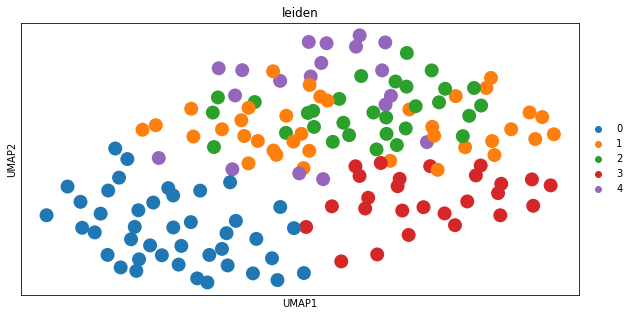

In [50]:
plt.rcParams["figure.figsize"] = (10,5)
# neighborhood graph
sc.pp.neighbors(grouped_pcw4, n_neighbors=10, n_pcs=50)
sc.tl.leiden(grouped_pcw4)
# embedding using UMAP
sc.tl.paga(grouped_pcw4)
sc.pl.paga(grouped_pcw4, plot=False)
sc.tl.umap(grouped_pcw4, init_pos='paga')
#sc.tl.umap(grouped_pcw4)
# cluster
sc.pl.umap(grouped_pcw4, color=['leiden'])

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running PAGA
    finished (0:00:00)
computing UMAP
    finished (0:00:01)


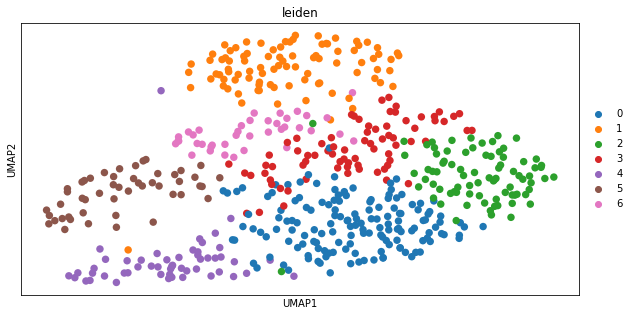

In [25]:
plt.rcParams["figure.figsize"] = (10,5)
# neighborhood graph
sc.pp.neighbors(grouped_pcw6, n_neighbors=10, n_pcs=50)
sc.tl.leiden(grouped_pcw6)
# embedding using UMAP
sc.tl.paga(grouped_pcw6)
sc.pl.paga(grouped_pcw6, plot=False)
sc.tl.umap(grouped_pcw6, init_pos='paga')
# cluster
sc.pl.umap(grouped_pcw6, color=['leiden'])

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running PAGA
    finished (0:00:00)
computing UMAP
    finished (0:00:01)


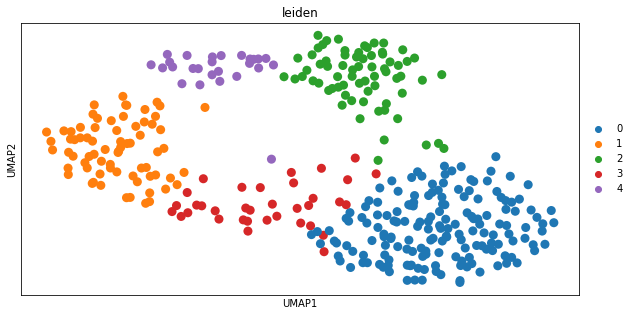

In [26]:
plt.rcParams["figure.figsize"] = (10,5)
# neighborhood graph
sc.pp.neighbors(grouped_pcw9, n_neighbors=10, n_pcs=50)
sc.tl.leiden(grouped_pcw9)
# embedding using UMAP
sc.tl.paga(grouped_pcw9)
sc.pl.paga(grouped_pcw9, plot=False)
sc.tl.umap(grouped_pcw9, init_pos='paga')
# cluster
sc.pl.umap(grouped_pcw9, color=['leiden'])

In [30]:
import gc
import numpy as np
import pandas as pd
import math
import scanpy.plotting
import torch
import torch.nn as nn
from torch.nn.parameter import Parameter
from torch.nn.modules.module import Module
import torch.nn.functional as F
import anndata
import pyro
import pyro.distributions as dist
from scipy.sparse import csc_matrix
from scvi.module.base import PyroBaseModuleClass
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from umap import UMAP
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import ClippedAdam,AdagradRMSProp
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score,normalized_mutual_info_score
import os

os.environ["CUDA_VISIBLE_DEVICES"] = '1'
pyro.distributions.enable_validation(False)
pyro.set_rng_seed(0)

class GraphConvolution(Module):
    """
    Simple GCN layer, similar to https://arxiv.org/abs/1609.02907
    """

    def __init__(self, in_features, out_features, bias=True):
        super(GraphConvolution, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = Parameter(torch.FloatTensor(in_features, out_features))
        if bias:
            self.bias = Parameter(torch.FloatTensor(out_features))  # bias?
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def forward(self, input, adj):
        support = torch.mm(input, self.weight)
        output = torch.spmm(adj, support)
        if self.bias is not None:
            return output + self.bias
        else:
            return output

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ' -> ' \
               + str(self.out_features) + ')'

class Encoder(nn.Module):
    def __init__(self, in_dim, z_dim, nhid, hidden_dim, dropout):
        super().__init__()
        self.gc1 = GraphConvolution(in_dim, nhid)
        self.dropout = dropout
        self.fc1 = nn.Linear(nhid, hidden_dim)
        self.fc21 = nn.Linear(hidden_dim, z_dim)
        self.fc22 = nn.Linear(hidden_dim, z_dim)
        self.softplus = nn.Softplus()

    def forward(self, x,adj):
        ###
        x = F.relu(self.gc1(x, adj))  # ReLU(AXW)
        x = F.dropout(x, self.dropout, training=self.training)
        hidden = self.softplus(self.fc1(x))
        z_loc = self.softplus(self.fc21(hidden))
        z_scale = torch.exp(self.softplus(self.fc22(hidden)))
        # latent z
        return z_loc, z_scale

    
class Decoder(nn.Module):
    def __init__(self, in_dim, z_dim, hidden_dim):
        super().__init__()

        self.fc1 = nn.Linear(z_dim, hidden_dim)
        self.fc21 = nn.Linear(hidden_dim, in_dim)
        self.fc22 = nn.Linear(hidden_dim, in_dim)

        self.softplus = nn.Softplus()

    def forward(self, z):
        ###
        hidden = self.softplus(self.fc1(z))
        count = self.softplus(self.fc21(hidden))
        prob = self.softplus(self.fc22(hidden))
        
        ######
        return count, prob



class VAE(PyroBaseModuleClass):
    def __init__(self, n_input, n_latent, nhid, n_clusters, dropout):
        super().__init__()
        self.n_latent = n_latent
        self.n_input = n_input
        self.n_clusters = n_clusters

        self.decoder = Decoder(n_input, n_latent, 400)
        self.log_theta = torch.nn.Parameter(torch.randn(n_input))
        self.gate_logits = torch.nn.Parameter(torch.randn(n_input),requires_grad=True)
        self.embeddings = nn.Parameter(torch.randn(self.n_clusters, n_latent) * 0.05, requires_grad=True)
        self.encoder = Encoder(n_input, n_latent,  nhid, 128,  dropout)

    def model(self, x,adj):
        pyro.module("decoder", self)
        with pyro.plate("data", x.shape[0]):
            z_loc = x.new_zeros(torch.Size((x.shape[0], self.n_latent)))
            z_scale = x.new_ones(torch.Size((x.shape[0], self.n_latent)))
            z = pyro.sample("latent", dist.Normal(z_loc, z_scale).to_event(1))  # loss
            count, prob = self.decoder(z)
            ######
            x_dist = dist.ZeroInflatedNegativeBinomial(total_count=count+1,probs=prob, gate_logits=self.gate_logits)
            pyro.sample("obs1", x_dist.to_event(1), obs=x)  # loss function calculated added tgt


    def guide(self, x,adj):
        pyro.module("encoder", self)
        with pyro.plate("data", x.shape[0]):
            x_ = torch.log(1+x)
            [qz_m, qz_v] = self.encoder(x_,adj)
            pyro.sample("latent", dist.Normal(qz_m,qz_v).to_event(1))  # loss nearest to std norm dist in vae(can be other dist)


    def getZ(self, x, adj):
        z_loc, z_scale = self.encoder(x,adj)
        z = dist.Normal(z_loc, z_scale).sample()
        return z




def train(svi, train_loader,adj, use_cuda=True):
    epoch_loss = 0
    for x in train_loader:
        if use_cuda:
            x = x.cuda()
            adj = adj.cuda()
        epoch_loss += svi.step(x,adj)

    normalizer_train = len(train_loader.dataset)
    total_epoch_loss_train = epoch_loss / normalizer_train
    return total_epoch_loss_train



[epoch 000] average training loss: 2963637.7937
[epoch 001] average training loss: 15644845.5085
[epoch 002] average training loss: 977089.6534
[epoch 003] average training loss: 77689.4873
[epoch 004] average training loss: 44399.5609
[epoch 005] average training loss: 18086.1779
[epoch 006] average training loss: 16594.9752
[epoch 007] average training loss: 13780.6286
[epoch 008] average training loss: 12005.2891
[epoch 009] average training loss: 11339.5993
[epoch 010] average training loss: 8310.1654
[epoch 011] average training loss: 7231.8875
[epoch 012] average training loss: 6951.1084
[epoch 013] average training loss: 7181.3453
[epoch 014] average training loss: 5990.2092
[epoch 015] average training loss: 6540.3716
[epoch 016] average training loss: 5245.5292
[epoch 017] average training loss: 4928.7699
[epoch 018] average training loss: 4617.8318
[epoch 019] average training loss: 4468.3407
[epoch 020] average training loss: 4206.8345
[epoch 021] average training loss: 4079

[epoch 182] average training loss: 2317.8970
[epoch 183] average training loss: 2318.0836
[epoch 184] average training loss: 2317.2526
[epoch 185] average training loss: 2317.5318
[epoch 186] average training loss: 2316.0398
[epoch 187] average training loss: 2317.8985
[epoch 188] average training loss: 2316.6145
[epoch 189] average training loss: 2316.5065
[epoch 190] average training loss: 2316.0067
[epoch 191] average training loss: 2316.2166
[epoch 192] average training loss: 2314.6167
[epoch 193] average training loss: 2315.5173
[epoch 194] average training loss: 2313.6341
[epoch 195] average training loss: 2314.3885
[epoch 196] average training loss: 2314.3534
[epoch 197] average training loss: 2312.9145
[epoch 198] average training loss: 2312.6229
[epoch 199] average training loss: 2313.8143
[epoch 200] average training loss: 2313.8597
[epoch 201] average training loss: 2314.2482
[epoch 202] average training loss: 2312.9132
[epoch 203] average training loss: 2312.7731
[epoch 204

[epoch 365] average training loss: 2284.9880
[epoch 366] average training loss: 2283.7223
[epoch 367] average training loss: 2284.6549
[epoch 368] average training loss: 2284.8483
[epoch 369] average training loss: 2283.7946
[epoch 370] average training loss: 2284.4599
[epoch 371] average training loss: 2283.5410
[epoch 372] average training loss: 2283.8418
[epoch 373] average training loss: 2283.7171
[epoch 374] average training loss: 2284.0957
[epoch 375] average training loss: 2283.9312
[epoch 376] average training loss: 2282.7651
[epoch 377] average training loss: 2283.3822
[epoch 378] average training loss: 2283.1067
[epoch 379] average training loss: 2283.6646
[epoch 380] average training loss: 2282.5693
[epoch 381] average training loss: 2282.7927
[epoch 382] average training loss: 2283.4352
[epoch 383] average training loss: 2282.1540
[epoch 384] average training loss: 2282.6344
[epoch 385] average training loss: 2283.0782
[epoch 386] average training loss: 2281.7679
[epoch 387

[epoch 548] average training loss: 2261.6287
[epoch 549] average training loss: 2261.3048
[epoch 550] average training loss: 2259.2999
[epoch 551] average training loss: 2262.1791
[epoch 552] average training loss: 2261.5114
[epoch 553] average training loss: 2260.6766
[epoch 554] average training loss: 2259.8826
[epoch 555] average training loss: 2259.5376
[epoch 556] average training loss: 2259.8386
[epoch 557] average training loss: 2259.2702
[epoch 558] average training loss: 2261.2365
[epoch 559] average training loss: 2259.3890
[epoch 560] average training loss: 2260.8165
[epoch 561] average training loss: 2259.4691
[epoch 562] average training loss: 2258.5131
[epoch 563] average training loss: 2258.7221
[epoch 564] average training loss: 2259.0094
[epoch 565] average training loss: 2258.4349
[epoch 566] average training loss: 2259.0523
[epoch 567] average training loss: 2257.6982
[epoch 568] average training loss: 2257.5502
[epoch 569] average training loss: 2258.5119
[epoch 570

[epoch 731] average training loss: 2234.0561
[epoch 732] average training loss: 2233.7134
[epoch 733] average training loss: 2232.6709
[epoch 734] average training loss: 2233.7544
[epoch 735] average training loss: 2232.8143
[epoch 736] average training loss: 2233.2866
[epoch 737] average training loss: 2232.1922
[epoch 738] average training loss: 2232.3914
[epoch 739] average training loss: 2233.7870
[epoch 740] average training loss: 2231.7613
[epoch 741] average training loss: 2233.5079
[epoch 742] average training loss: 2230.4748
[epoch 743] average training loss: 2231.5667
[epoch 744] average training loss: 2230.4355
[epoch 745] average training loss: 2234.1960
[epoch 746] average training loss: 2230.7263
[epoch 747] average training loss: 2233.0890
[epoch 748] average training loss: 2231.6850
[epoch 749] average training loss: 2229.3288
[epoch 750] average training loss: 2230.2318
[epoch 751] average training loss: 2231.2938
[epoch 752] average training loss: 2231.5756
[epoch 753

[epoch 914] average training loss: 2216.3740
[epoch 915] average training loss: 2218.3943
[epoch 916] average training loss: 2219.5439
[epoch 917] average training loss: 2215.1531
[epoch 918] average training loss: 2217.9270
[epoch 919] average training loss: 2217.3227
[epoch 920] average training loss: 2220.2323
[epoch 921] average training loss: 2216.0620
[epoch 922] average training loss: 2215.1587
[epoch 923] average training loss: 2218.6646
[epoch 924] average training loss: 2215.0878
[epoch 925] average training loss: 2216.8398
[epoch 926] average training loss: 2215.7098
[epoch 927] average training loss: 2215.5255
[epoch 928] average training loss: 2216.2905
[epoch 929] average training loss: 2218.2084
[epoch 930] average training loss: 2216.9691
[epoch 931] average training loss: 2216.9303
[epoch 932] average training loss: 2215.4971
[epoch 933] average training loss: 2213.2571
[epoch 934] average training loss: 2215.8133
[epoch 935] average training loss: 2214.2641
[epoch 936

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_9508/3979088975.py:74: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_z = anndata.AnnData(TZ)
/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


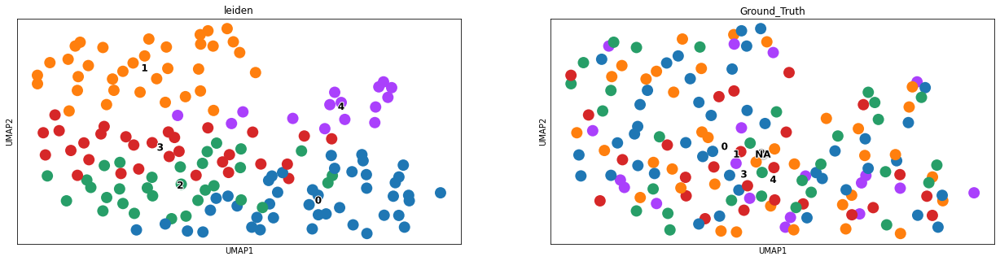

ARI: 0.1336747723429894  NMI: 0.19761674609773722


In [51]:
class H5ADataSet(Dataset):
    def __init__(self, adata):
        self.data = adata

    def __len__(self):
        return self.data.X.shape[0]

    def __getitem__(self, idx):
        x = csc_matrix(self.data.X[idx])[0].toarray()[0]
        x_tensor = x.astype(np.float32)
        return x_tensor

    
def load_data(adata):
    adj = adata.obsp["agg_knn_connectivity"]  # 154x154 for pcw4
    features = grouped_pcw4.obsm['X_pca'].copy() #154x50
    return adj, features

dataset = grouped_pcw4
adj, features = load_data(dataset)

celldata = H5ADataSet(dataset)
adata = grouped_pcw4

NUMGENS = 3745
#NUMGENS = 50
dimZ = 72
dimG = 128
BATCHSIZE = 154
LEARN_RATE = 1.0e-4
USE_CUDA = False
NUM_EPOCHS = 1000
nclusters = 10
cell_loader = DataLoader(celldata, batch_size=BATCHSIZE)
#cell_loader = DataLoader(features, batch_size=BATCHSIZE)

pyro.clear_param_store()

vae = VAE(NUMGENS, dimZ, dimG, nclusters, 0.5)
if USE_CUDA:
    vae.cuda()
adam_args ={"lr":LEARN_RATE}
optimizer = ClippedAdam(adam_args)

elbo = Trace_ELBO(strict_enumeration_warning=False)
svi = SVI(vae.model, vae.guide, optimizer, loss=elbo)

gc.collect()
torch.cuda.empty_cache()

train_elbo = []
test_elbo = []

adj = torch.FloatTensor(adj)


for epoch in range(NUM_EPOCHS):
    total_epoch_loss_train = train(svi, cell_loader,adj, use_cuda=USE_CUDA)
    train_elbo.append(-total_epoch_loss_train)
    print("[epoch %03d] average training loss: %.4f" % (epoch, total_epoch_loss_train))

torch.save(vae,'./vae.pkl')

TZ = []
for x in cell_loader:
    if USE_CUDA:
        x = x.cuda()
        adj = adj.cuda()
    z = vae.getZ(x,adj)
    zz = z.cpu().detach().numpy().tolist()
    TZ+=zz
TZ = np.array(TZ)
TZ = pd.DataFrame(TZ)
adata_z = anndata.AnnData(TZ)
#scanpy.pp.neighbors(adata_z)
sc.pp.neighbors(adata_z, n_neighbors=10, n_pcs=50)
scanpy.tl.leiden(adata_z,resolution=1)
sc.tl.paga(adata_z)
sc.pl.paga(adata_z, plot=False)
#scanpy.tl.umap(adata_z)
sc.tl.umap(adata_z, init_pos='paga')

plt.rcParams["figure.figsize"] = (10,5)
adata_z.obs['Ground_Truth'] = adata.obs['leiden']
scanpy.pl.umap(adata_z,color=['leiden','Ground_Truth'], palette=scanpy.pl.palettes.default_20,  legend_loc = 'on data',legend_fontsize = 12,legend_fontoutline=2)
ARI = adjusted_rand_score(adata.obs['leiden'], adata_z.obs['leiden'])
NMI = normalized_mutual_info_score(adata.obs['leiden'],adata_z.obs['leiden'])
print("ARI: "+str(ARI)+"  "+"NMI: "+str(NMI))

[epoch 000] average training loss: 4464882385.2779
[epoch 001] average training loss: 67148492182.2956
[epoch 002] average training loss: 901420351.5043
[epoch 003] average training loss: 190501605.9546
[epoch 004] average training loss: 36459429.7557
[epoch 005] average training loss: 7865137.4218
[epoch 006] average training loss: 507307.0319
[epoch 007] average training loss: 5238628.3591
[epoch 008] average training loss: 239454.5512
[epoch 009] average training loss: 133553.1574
[epoch 010] average training loss: 97417.1844
[epoch 011] average training loss: 596006.2477
[epoch 012] average training loss: 27106.8173
[epoch 013] average training loss: 22278.4203
[epoch 014] average training loss: 17912.9399
[epoch 015] average training loss: 15281.4929
[epoch 016] average training loss: 13872.5824
[epoch 017] average training loss: 12364.1793
[epoch 018] average training loss: 11694.8344
[epoch 019] average training loss: 10843.5197
[epoch 020] average training loss: 9985.0041
[epoc

[epoch 181] average training loss: 3779.5384
[epoch 182] average training loss: 3779.0463
[epoch 183] average training loss: 3778.1522
[epoch 184] average training loss: 3777.1376
[epoch 185] average training loss: 3776.8590
[epoch 186] average training loss: 3775.9855
[epoch 187] average training loss: 3775.2620
[epoch 188] average training loss: 3774.6286
[epoch 189] average training loss: 3773.8728
[epoch 190] average training loss: 3772.5891
[epoch 191] average training loss: 3772.5734
[epoch 192] average training loss: 3771.3030
[epoch 193] average training loss: 3770.4046
[epoch 194] average training loss: 3770.0275
[epoch 195] average training loss: 3769.7855
[epoch 196] average training loss: 3768.6378
[epoch 197] average training loss: 3768.1232
[epoch 198] average training loss: 3767.3928
[epoch 199] average training loss: 3766.6531
[epoch 200] average training loss: 3765.8765
[epoch 201] average training loss: 3765.3882
[epoch 202] average training loss: 3765.1417
[epoch 203

[epoch 364] average training loss: 3700.4403
[epoch 365] average training loss: 3701.3777
[epoch 366] average training loss: 3700.9348
[epoch 367] average training loss: 3700.5537
[epoch 368] average training loss: 3701.2320
[epoch 369] average training loss: 3700.1842
[epoch 370] average training loss: 3699.3322
[epoch 371] average training loss: 3699.4137
[epoch 372] average training loss: 3699.0701
[epoch 373] average training loss: 3698.3779
[epoch 374] average training loss: 3698.7828
[epoch 375] average training loss: 3698.4916
[epoch 376] average training loss: 3697.9929
[epoch 377] average training loss: 3697.2089
[epoch 378] average training loss: 3696.9174
[epoch 379] average training loss: 3696.3794
[epoch 380] average training loss: 3696.4289
[epoch 381] average training loss: 3697.2076
[epoch 382] average training loss: 3696.0014
[epoch 383] average training loss: 3694.7629
[epoch 384] average training loss: 3696.0847
[epoch 385] average training loss: 3695.1246
[epoch 386

[epoch 547] average training loss: 3669.5884
[epoch 548] average training loss: 3668.9636
[epoch 549] average training loss: 3668.8742
[epoch 550] average training loss: 3669.5415
[epoch 551] average training loss: 3669.0045
[epoch 552] average training loss: 3668.6407
[epoch 553] average training loss: 3667.6307
[epoch 554] average training loss: 3668.6591
[epoch 555] average training loss: 3669.1792
[epoch 556] average training loss: 3668.6715
[epoch 557] average training loss: 3667.7896
[epoch 558] average training loss: 3667.6907
[epoch 559] average training loss: 3667.9930
[epoch 560] average training loss: 3667.4511
[epoch 561] average training loss: 3668.3026
[epoch 562] average training loss: 3668.3672
[epoch 563] average training loss: 3667.2317
[epoch 564] average training loss: 3667.4611
[epoch 565] average training loss: 3667.0250
[epoch 566] average training loss: 3667.2294
[epoch 567] average training loss: 3666.5002
[epoch 568] average training loss: 3666.8524
[epoch 569

[epoch 730] average training loss: 3644.7198
[epoch 731] average training loss: 3645.2964
[epoch 732] average training loss: 3645.0545
[epoch 733] average training loss: 3644.9548
[epoch 734] average training loss: 3644.1081
[epoch 735] average training loss: 3644.8432
[epoch 736] average training loss: 3644.6673
[epoch 737] average training loss: 3642.6473
[epoch 738] average training loss: 3642.9762
[epoch 739] average training loss: 3644.0267
[epoch 740] average training loss: 3643.6856
[epoch 741] average training loss: 3643.9045
[epoch 742] average training loss: 3643.2131
[epoch 743] average training loss: 3643.4100
[epoch 744] average training loss: 3643.2344
[epoch 745] average training loss: 3642.3643
[epoch 746] average training loss: 3644.1832
[epoch 747] average training loss: 3644.1433
[epoch 748] average training loss: 3642.7038
[epoch 749] average training loss: 3642.3525
[epoch 750] average training loss: 3643.3098
[epoch 751] average training loss: 3641.9445
[epoch 752

[epoch 913] average training loss: 3625.8623
[epoch 914] average training loss: 3625.5249
[epoch 915] average training loss: 3625.3649
[epoch 916] average training loss: 3625.1714
[epoch 917] average training loss: 3626.4718
[epoch 918] average training loss: 3625.7024
[epoch 919] average training loss: 3624.8008
[epoch 920] average training loss: 3624.2823
[epoch 921] average training loss: 3625.1316
[epoch 922] average training loss: 3624.9675
[epoch 923] average training loss: 3623.6848
[epoch 924] average training loss: 3624.2703
[epoch 925] average training loss: 3623.0150
[epoch 926] average training loss: 3624.1679
[epoch 927] average training loss: 3624.7344
[epoch 928] average training loss: 3623.9983
[epoch 929] average training loss: 3624.7767
[epoch 930] average training loss: 3625.4672
[epoch 931] average training loss: 3623.4314
[epoch 932] average training loss: 3622.4159
[epoch 933] average training loss: 3623.2973
[epoch 934] average training loss: 3623.0062
[epoch 935

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_9508/9841640.py:73: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_z = anndata.AnnData(TZ)
/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


    finished (0:00:01)


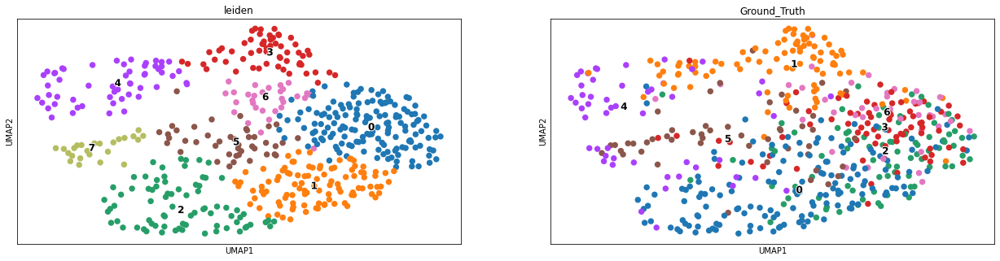

ARI: 0.25013302350650474  NMI: 0.37962784749768613


In [32]:
class H5ADataSet(Dataset):
    def __init__(self, adata):
        self.data = adata

    def __len__(self):
        return self.data.X.shape[0]

    def __getitem__(self, idx):
        x = csc_matrix(self.data.X[idx])[0].toarray()[0]
        x_tensor = x.astype(np.float32)
        return x_tensor

    
def load_data(adata):
    adj = adata.obsp["agg_knn_connectivity"]  # 154x154 for pcw4
    features = grouped_pcw4.obsm['X_pca'].copy() #154x50
    return adj, features

dataset = grouped_pcw6
adj, features = load_data(dataset)

celldata = H5ADataSet(dataset)
adata = grouped_pcw6

NUMGENS = 3745
dimZ = 50
dimG = 100
BATCHSIZE = 539
LEARN_RATE = 1.0e-4
USE_CUDA = False
NUM_EPOCHS = 1000
nclusters = 20
cell_loader = DataLoader(celldata, batch_size=BATCHSIZE)


pyro.clear_param_store()

vae = VAE(NUMGENS, dimZ, dimG, nclusters, 0.5)
if USE_CUDA:
    vae.cuda()
adam_args ={"lr":LEARN_RATE}
optimizer = ClippedAdam(adam_args)

elbo = Trace_ELBO(strict_enumeration_warning=False)
svi = SVI(vae.model, vae.guide, optimizer, loss=elbo)

gc.collect()
torch.cuda.empty_cache()

train_elbo = []
test_elbo = []

adj = torch.FloatTensor(adj)


for epoch in range(NUM_EPOCHS):
    total_epoch_loss_train = train(svi, cell_loader,adj, use_cuda=USE_CUDA)
    train_elbo.append(-total_epoch_loss_train)
    print("[epoch %03d] average training loss: %.4f" % (epoch, total_epoch_loss_train))

torch.save(vae,'./vae.pkl')

TZ = []
for x in cell_loader:
    if USE_CUDA:
        x = x.cuda()
        adj = adj.cuda()
    z = vae.getZ(x,adj)
    zz = z.cpu().detach().numpy().tolist()
    TZ+=zz
TZ = np.array(TZ)
TZ = pd.DataFrame(TZ)
adata_z = anndata.AnnData(TZ)
#scanpy.pp.neighbors(adata_z)
sc.pp.neighbors(adata_z, n_neighbors=10, n_pcs=50)
scanpy.tl.leiden(adata_z,resolution=1)
#sc.tl.paga(adata_z)
#sc.pl.paga(adata_z, plot=False)
scanpy.tl.umap(adata_z)
#sc.tl.umap(adata_z, init_pos='paga')

adata_z.obs['Ground_Truth'] = list(adata.obs['leiden'])
scanpy.pl.umap(adata_z,color=['leiden','Ground_Truth'], palette=scanpy.pl.palettes.default_20,  legend_loc = 'on data',legend_fontsize = 12,legend_fontoutline=2)
ARI = adjusted_rand_score(adata.obs['leiden'], adata_z.obs['leiden'])
NMI = normalized_mutual_info_score(adata.obs['leiden'],adata_z.obs['leiden'])
print("ARI: "+str(ARI)+"  "+"NMI: "+str(NMI))

In [33]:
grouped_pcw9

AnnData object with n_obs × n_vars = 366 × 3745
    obs: 'n_genes_by_counts', 'total_counts', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors'
    obsm: 'spatial_coord-new_x', 'spatial_coord-new_y', 'spatial_coord', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'knn_connectivity', 'spa_distances', 'gau_spa_distances', 'gene_distances', 'aff_matrix', 'agg_matrix', 'agg_knn_connectivity', 'distances', 'connectivities'

[epoch 000] average training loss: 1401163978.0158
[epoch 001] average training loss: 2963089235.5810
[epoch 002] average training loss: 1317445103.4242
[epoch 003] average training loss: 12560309.0924
[epoch 004] average training loss: 4796118.7177
[epoch 005] average training loss: 1208078.8366
[epoch 006] average training loss: 3263590.4103
[epoch 007] average training loss: 328482.8528
[epoch 008] average training loss: 856965.7606
[epoch 009] average training loss: 48071.3077
[epoch 010] average training loss: 85156.0643
[epoch 011] average training loss: 22330.1996
[epoch 012] average training loss: 27050.6755
[epoch 013] average training loss: 19274.6384
[epoch 014] average training loss: 13410.5843
[epoch 015] average training loss: 12788.6393
[epoch 016] average training loss: 10591.6785
[epoch 017] average training loss: 9854.3946
[epoch 018] average training loss: 9620.6528
[epoch 019] average training loss: 8994.1804
[epoch 020] average training loss: 8199.7871
[epoch 021] 

[epoch 182] average training loss: 3361.2247
[epoch 183] average training loss: 3360.3700
[epoch 184] average training loss: 3359.2568
[epoch 185] average training loss: 3358.5954
[epoch 186] average training loss: 3358.1628
[epoch 187] average training loss: 3357.2351
[epoch 188] average training loss: 3356.7414
[epoch 189] average training loss: 3355.8776
[epoch 190] average training loss: 3355.2643
[epoch 191] average training loss: 3355.1481
[epoch 192] average training loss: 3353.4899
[epoch 193] average training loss: 3353.6184
[epoch 194] average training loss: 3352.6586
[epoch 195] average training loss: 3352.0629
[epoch 196] average training loss: 3351.7700
[epoch 197] average training loss: 3352.1839
[epoch 198] average training loss: 3350.4204
[epoch 199] average training loss: 3349.4513
[epoch 200] average training loss: 3348.9353
[epoch 201] average training loss: 3349.3790
[epoch 202] average training loss: 3348.2838
[epoch 203] average training loss: 3347.9387
[epoch 204

[epoch 365] average training loss: 3277.2919
[epoch 366] average training loss: 3275.8868
[epoch 367] average training loss: 3275.5662
[epoch 368] average training loss: 3276.2263
[epoch 369] average training loss: 3277.0724
[epoch 370] average training loss: 3276.5299
[epoch 371] average training loss: 3275.3067
[epoch 372] average training loss: 3274.0167
[epoch 373] average training loss: 3275.6022
[epoch 374] average training loss: 3274.4568
[epoch 375] average training loss: 3275.1700
[epoch 376] average training loss: 3272.6201
[epoch 377] average training loss: 3273.4072
[epoch 378] average training loss: 3273.0876
[epoch 379] average training loss: 3273.3961
[epoch 380] average training loss: 3272.7496
[epoch 381] average training loss: 3272.3251
[epoch 382] average training loss: 3272.2997
[epoch 383] average training loss: 3270.7771
[epoch 384] average training loss: 3272.2736
[epoch 385] average training loss: 3272.1269
[epoch 386] average training loss: 3270.8386
[epoch 387

[epoch 548] average training loss: 3237.2527
[epoch 549] average training loss: 3238.3994
[epoch 550] average training loss: 3237.1127
[epoch 551] average training loss: 3237.8469
[epoch 552] average training loss: 3238.0336
[epoch 553] average training loss: 3236.2293
[epoch 554] average training loss: 3236.0156
[epoch 555] average training loss: 3237.6856
[epoch 556] average training loss: 3238.7120
[epoch 557] average training loss: 3238.0744
[epoch 558] average training loss: 3237.5423
[epoch 559] average training loss: 3237.0879
[epoch 560] average training loss: 3234.9214
[epoch 561] average training loss: 3237.9489
[epoch 562] average training loss: 3237.4176
[epoch 563] average training loss: 3235.4701
[epoch 564] average training loss: 3235.6550
[epoch 565] average training loss: 3237.1715
[epoch 566] average training loss: 3236.2607
[epoch 567] average training loss: 3235.1520
[epoch 568] average training loss: 3234.2547
[epoch 569] average training loss: 3235.1391
[epoch 570

[epoch 731] average training loss: 3217.4598
[epoch 732] average training loss: 3218.0467
[epoch 733] average training loss: 3216.7835
[epoch 734] average training loss: 3215.2582
[epoch 735] average training loss: 3216.3741
[epoch 736] average training loss: 3216.9270
[epoch 737] average training loss: 3217.3316
[epoch 738] average training loss: 3215.7425
[epoch 739] average training loss: 3215.8743
[epoch 740] average training loss: 3214.1139
[epoch 741] average training loss: 3216.9666
[epoch 742] average training loss: 3215.0485
[epoch 743] average training loss: 3215.7208
[epoch 744] average training loss: 3214.0329
[epoch 745] average training loss: 3214.4623
[epoch 746] average training loss: 3215.6779
[epoch 747] average training loss: 3214.8752
[epoch 748] average training loss: 3215.5633
[epoch 749] average training loss: 3216.0529
[epoch 750] average training loss: 3213.9727
[epoch 751] average training loss: 3215.0430
[epoch 752] average training loss: 3214.2670
[epoch 753

[epoch 914] average training loss: 3198.4104
[epoch 915] average training loss: 3197.9604
[epoch 916] average training loss: 3199.2894
[epoch 917] average training loss: 3197.4425
[epoch 918] average training loss: 3196.0893
[epoch 919] average training loss: 3198.3262
[epoch 920] average training loss: 3196.0522
[epoch 921] average training loss: 3196.5377
[epoch 922] average training loss: 3197.4288
[epoch 923] average training loss: 3198.0283
[epoch 924] average training loss: 3197.6859
[epoch 925] average training loss: 3196.1627
[epoch 926] average training loss: 3196.1065
[epoch 927] average training loss: 3197.8531
[epoch 928] average training loss: 3198.1312
[epoch 929] average training loss: 3195.5660
[epoch 930] average training loss: 3196.4588
[epoch 931] average training loss: 3195.5823
[epoch 932] average training loss: 3195.4749
[epoch 933] average training loss: 3197.0043
[epoch 934] average training loss: 3194.8872
[epoch 935] average training loss: 3196.4793
[epoch 936

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_9508/1914182112.py:74: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_z = anndata.AnnData(TZ)
/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


    finished (0:00:01)


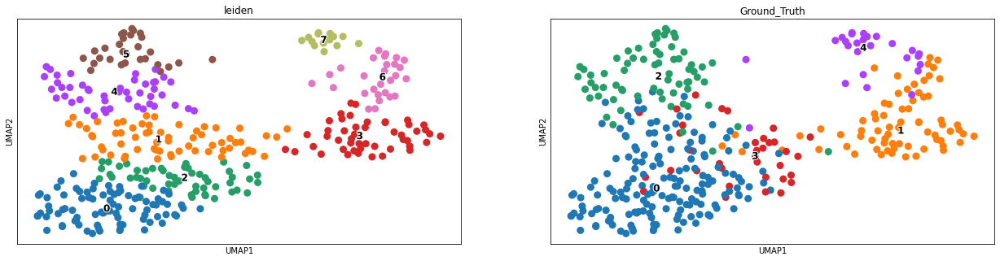

ARI: 0.38129318708548177  NMI: 0.5516020947320269


In [34]:
class H5ADataSet(Dataset):
    def __init__(self, adata):
        self.data = adata

    def __len__(self):
        return self.data.X.shape[0]

    def __getitem__(self, idx):
        x = csc_matrix(self.data.X[idx])[0].toarray()[0]
        x_tensor = x.astype(np.float32)
        return x_tensor

    
def load_data(adata):
    adj = adata.obsp["agg_knn_connectivity"]  # 154x154 for pcw4
    features = grouped_pcw4.obsm['X_pca'].copy() #154x50
    return adj, features

dataset = grouped_pcw9
adj, features = load_data(dataset)

celldata = H5ADataSet(dataset)
adata = grouped_pcw9

NUMGENS = 3745
#NUMGENS = 50
dimZ = 72
dimG = 128
BATCHSIZE = 366
LEARN_RATE = 1.0e-4
USE_CUDA = False
NUM_EPOCHS = 1000
nclusters = 10
cell_loader = DataLoader(celldata, batch_size=BATCHSIZE)


pyro.clear_param_store()

vae = VAE(NUMGENS, dimZ, dimG,nclusters, 0.5)
if USE_CUDA:
    vae.cuda()
adam_args ={"lr":LEARN_RATE}
optimizer = ClippedAdam(adam_args)

elbo = Trace_ELBO(strict_enumeration_warning=False)
svi = SVI(vae.model, vae.guide, optimizer, loss=elbo)

gc.collect()
torch.cuda.empty_cache()

train_elbo = []
test_elbo = []

adj = torch.FloatTensor(adj)


for epoch in range(NUM_EPOCHS):
    total_epoch_loss_train = train(svi, cell_loader,adj, use_cuda=USE_CUDA)
    train_elbo.append(-total_epoch_loss_train)
    print("[epoch %03d] average training loss: %.4f" % (epoch, total_epoch_loss_train))

torch.save(vae,'./vae.pkl')

TZ = []
for x in cell_loader:
    if USE_CUDA:
        x = x.cuda()
        adj = adj.cuda()
    z = vae.getZ(x,adj)
    zz = z.cpu().detach().numpy().tolist()
    TZ+=zz
TZ = np.array(TZ)
TZ = pd.DataFrame(TZ)
adata_z = anndata.AnnData(TZ)
#scanpy.pp.neighbors(adata_z)
sc.pp.neighbors(adata_z, n_neighbors=10, n_pcs=50)
scanpy.tl.leiden(adata_z,resolution=1)
#sc.tl.paga(adata_z)
#sc.pl.paga(adata_z, plot=False)
scanpy.tl.umap(adata_z)
#sc.tl.umap(adata_z, init_pos='paga')

adata_z.obs['Ground_Truth'] = list(adata.obs['leiden'])
scanpy.pl.umap(adata_z,color=['leiden','Ground_Truth'], palette=scanpy.pl.palettes.default_20,  legend_loc = 'on data',legend_fontsize = 12,legend_fontoutline=2)
ARI = adjusted_rand_score(adata.obs['leiden'], adata_z.obs['leiden'])
NMI = normalized_mutual_info_score(adata.obs['leiden'],adata_z.obs['leiden'])
print("ARI: "+str(ARI)+"  "+"NMI: "+str(NMI))

In [41]:
import torch
import pyro
print(torch.__version__)
print(pyro.__version__)
%xmode Verbose

1.11.0
1.8.1+06911dc
Exception reporting mode: Verbose
